In [1]:
import numpy as np
import matplotlib.pyplot as plt
import json
from astropy import units as u
import pandas as pd
import os
import seaborn as sns
from astropy.modeling.physical_models import BlackBody
from scipy.optimize import curve_fit
sns.set_context('paper')

In [2]:
FPATH = "/Users/snorris/manyTDE/data/sources/"

# defining filter wavelengths
filter_centers = {}
filter_centers['g.ztf'] = 4806
filter_centers['r.ztf'] = 6436
filter_centers['i.ztf'] = 7954
filter_centers['g.ps'] = 4810
filter_centers['r.ps'] = 6155
filter_centers['i.ps'] = 7503
filter_centers['g.sdss'] = 4672
filter_centers['r.sdss'] = 6141
filter_centers['i.sdss'] = 7458
filter_centers['UVW2.uvot'] = 1928 # AA
filter_centers['UVM2.uvot'] = 2246 # AA
filter_centers['UVW1.uvot'] = 2600 # AA
filter_centers['U.uvot'] = 3465 # AA
filter_centers['u.sdss'] = 3608
filter_centers['F125LP'] = 1496
filter_centers['F150LP'] = 1613
filter_centers['F225W'] = 2254 # HST
filter_centers['FUV'] = 1549
filter_centers['NUV'] = 2303
filter_centers['B.uvot'] = 4392 # AA
filter_centers['V.uvot'] = 5468 # AA
filter_centers['c.atlas'] = 5182
filter_centers['o.atlas'] = 6630
filter_centers['W1.wise'] = 33340
filter_centers['W2.wise'] = 45819

In [3]:
def get_lc(tde_name):
    """
    Input: TDE name (str)
    Returns: Data (dict), Full lightcurve json (dict), Lightcurve object (pandas DataFrame)
    """
    fname = tde_name + '.json'
    with open(os.path.join(FPATH, fname)) as f:
        data = json.load(f)

    lc = data['lightcurve']
    lc_df = pd.DataFrame(lc['data'], columns=lc['header'])

    return data, lc, lc_df

def get_sed(tde_name, days_from_peak=10):
	# days from peak is the number of days from the peak to use in the SED
    data, lc, lc_df = get_lc(tde_name)
    peak_df = lc_df[np.abs(lc_df['mjd'] - data['peak_mjd'])<=days_from_peak]
    peak_filters = np.unique(peak_df['filter'])
    wavelengths = [filter_centers[f] for f in peak_filters]
    fluxes = []
    for filt in peak_filters:
        if filt in data['extinction']['linear_extinction']:
            correct_filt = peak_df[peak_df['filter']==filt]
            meanflux1 = np.nanmean(correct_filt['flux_Jy'].values) / data['extinction']['linear_extinction'][filt]

            fluxes.append( meanflux1)
        else:
            fluxes.append(np.nanmean(peak_df[peak_df['filter']==filt]['flux_Jy'].values))

    return wavelengths, fluxes

In [4]:
def blackbody_flux(wav, T, L):
    bb = BlackBody(temperature=T*u.K)
    flux = bb(wav*u.AA)

    return L*flux.value

def get_temperature(tde_name, plotting=False):
	# Specify plotting = True if you want to visualize the best fit
    wave, flux = get_sed(tde_name)
    if len(flux) == 0:
    	return None
    popt, pcov = curve_fit(blackbody_flux,
                           wave, flux, p0 = [2e4, 1e19],
                           bounds = ([1, -np.inf], [1e6, np.inf]))
    temperature = popt[0]
    if plotting:
        plt.figure(dpi = 100)
        plt.scatter(wave, flux, label = 'Observed')
        x = np.linspace(1000, 10000, 100)
        plt.plot(x, blackbody_flux(x, *popt), label = 'Blackbody fit')
        plt.legend()
        plt.xlabel('Wavelength ($\\AA$)')
        plt.ylabel('Flux (units arbitraty)')
        plt.title(tde_name)
        plt.show()
    return temperature


In [5]:
### CODE START

json_list = os.listdir(FPATH)
del json_list[64]
json_list[-32]
tde_names = [n[:-5] for n in json_list]

temperatures = {}
for tde in tde_names:
    t = get_temperature(tde)
    temperatures[tde] = t
    if t:
    	print(f'Fit to {tde} is {t} degrees K.')
    else:
    	print(f'No observations near peak for TDE {tde}')



/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/384667270.py:12: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,


Fit to AT2020pj is 19876.073944266016 degrees K.
Fit to ASASSN-14li is 36013.261743088544 degrees K.
Fit to AT2021uvz is 19980.88233281307 degrees K.
Fit to AT2019azh is 23712.165978124067 degrees K.
Fit to PTF-09ge is 12478.37391072954 degrees K.
Fit to AT2020acka is 19975.180822656435 degrees K.
Fit to AT2021axu is 19882.971643179884 degrees K.
Fit to PS1-10jh is 20002.2736193606 degrees K.
Fit to AT2020abri is 19868.767077250686 degrees K.
Fit to AT2020wey is 43867.021961393104 degrees K.
Fit to AT2020yue is 11438.35472342738 degrees K.
Fit to AT2018bsi is 20001.16826288885 degrees K.
Fit to AT2020neh is 14285.281141635702 degrees K.
No observations near peak for TDE AT2020vwl
Fit to AT2022pna is 19923.809874221894 degrees K.
Fit to AT2021jsg is 19980.88574611383 degrees K.
Fit to AT2023mfm is 19931.070944618004 degrees K.
Fit to AT2021nwa is 37844.19607238657 degrees K.
Fit to AT2018lni is 20126.073301502132 degrees K.
Fit to AT2019mha is 19999.99997991547 degrees K.
Fit to AT2021s

In [6]:
with open('temperatures.json', 'w') as fp:
	json.dump(temperatures, fp)

/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/384667270.py:12: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,


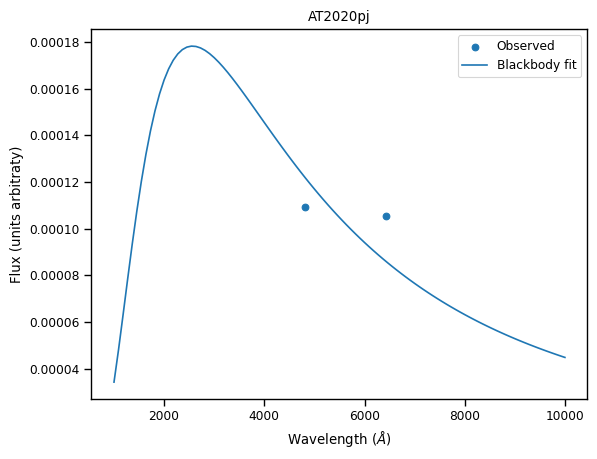

Fit to AT2020pj is 19876.073944266016 degrees K.


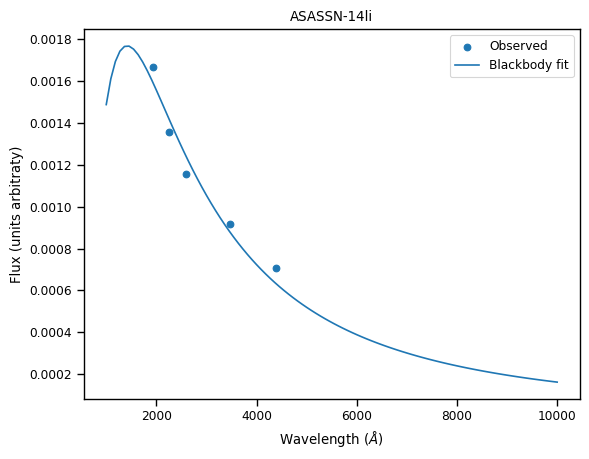

Fit to ASASSN-14li is 36013.261743088544 degrees K.


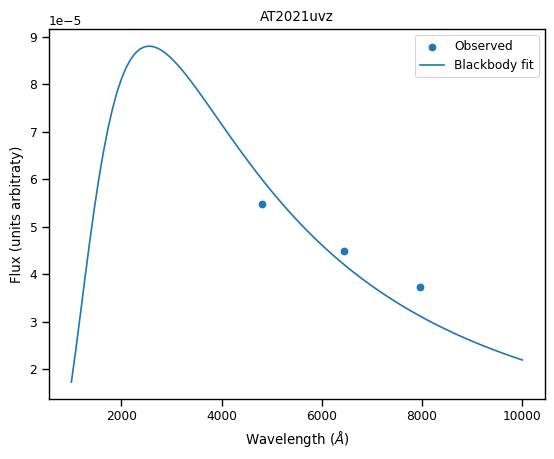

Fit to AT2021uvz is 19980.88233281307 degrees K.


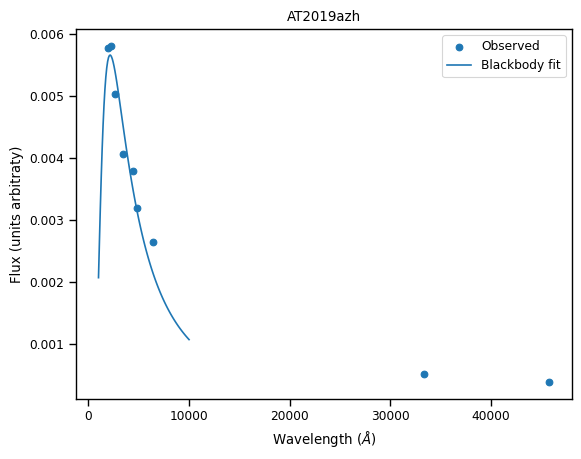

Fit to AT2019azh is 23712.165978124067 degrees K.


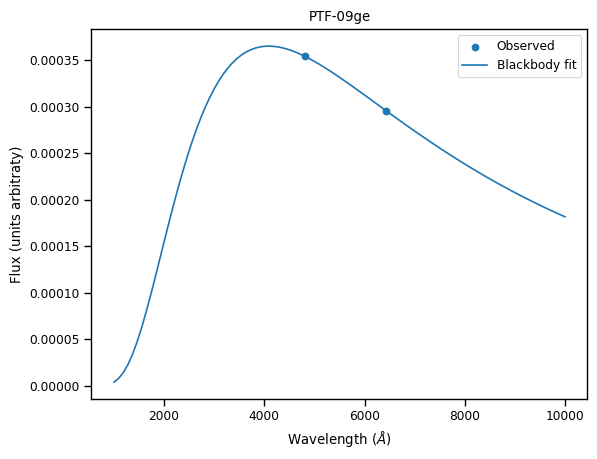

Fit to PTF-09ge is 12478.37391072954 degrees K.


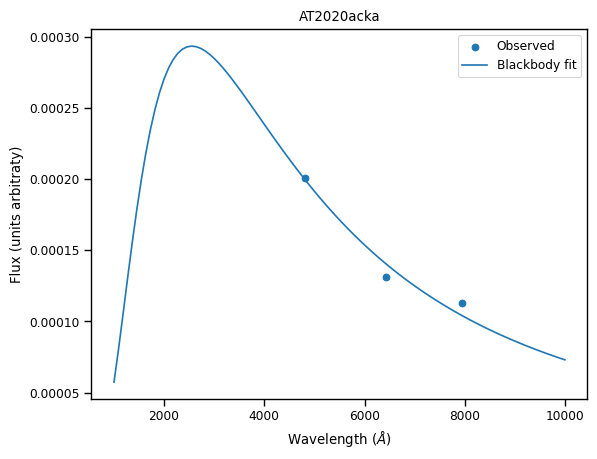

Fit to AT2020acka is 19975.180822656435 degrees K.


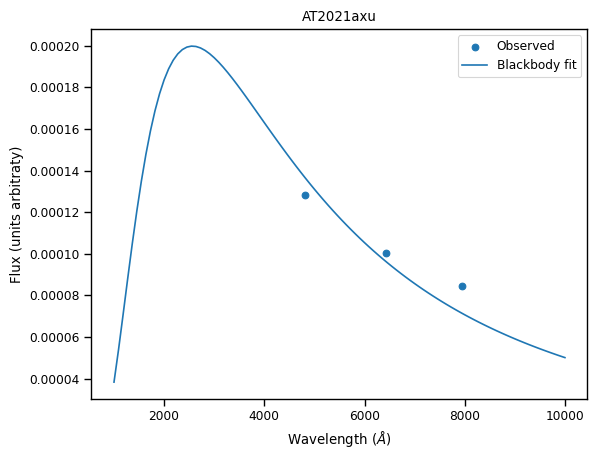

Fit to AT2021axu is 19882.971643179884 degrees K.


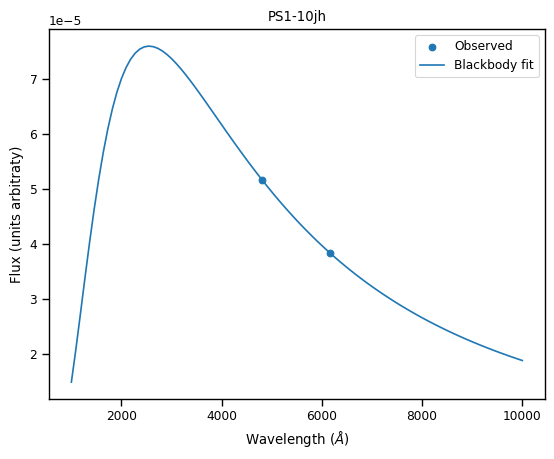

Fit to PS1-10jh is 20002.2736193606 degrees K.


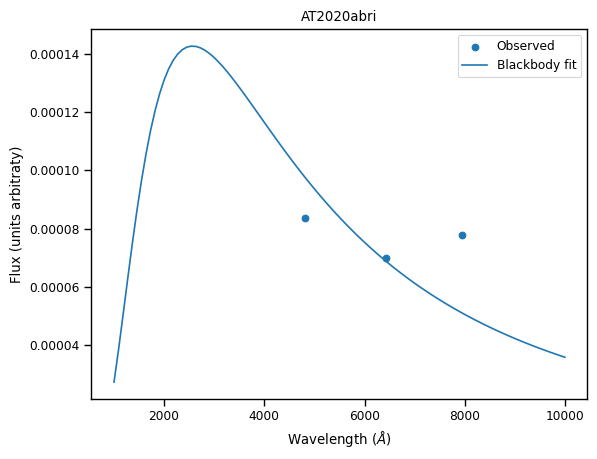

Fit to AT2020abri is 19868.767077250686 degrees K.


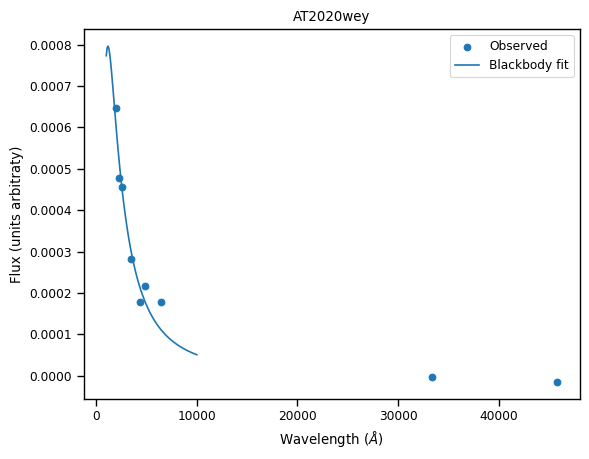

Fit to AT2020wey is 43867.021961393104 degrees K.


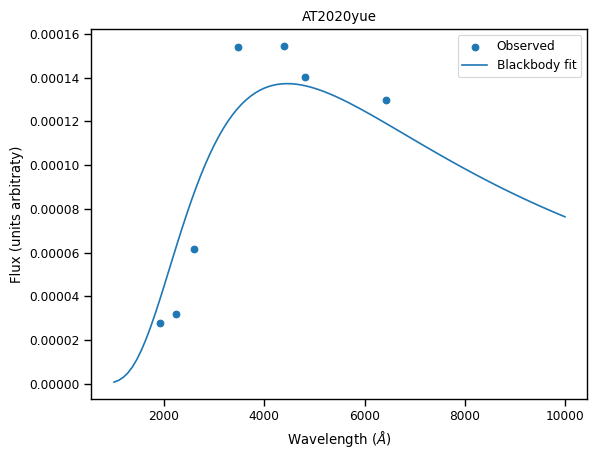

Fit to AT2020yue is 11438.35472342738 degrees K.


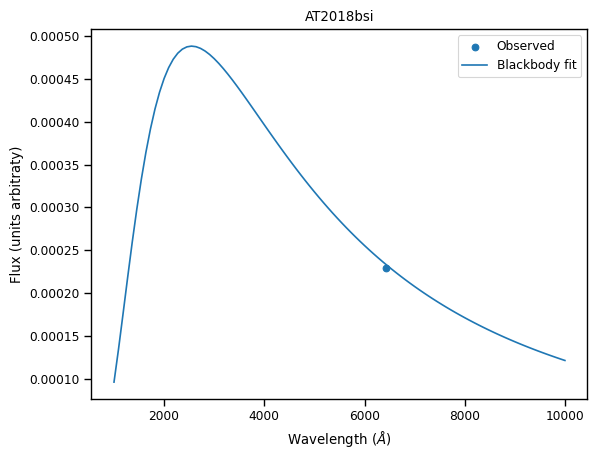

Fit to AT2018bsi is 20001.16826288885 degrees K.


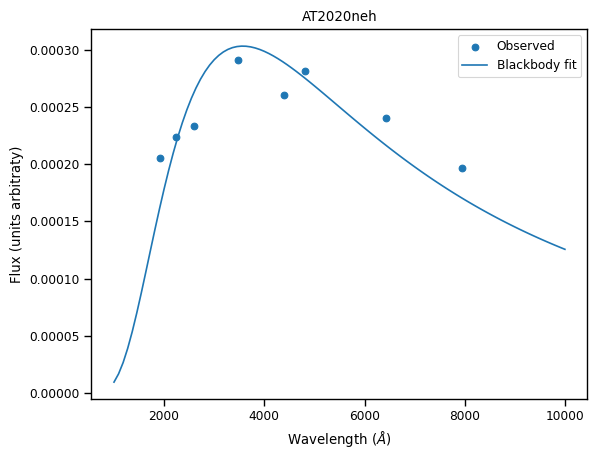

Fit to AT2020neh is 14285.281141635702 degrees K.
No observations near peak for TDE AT2020vwl


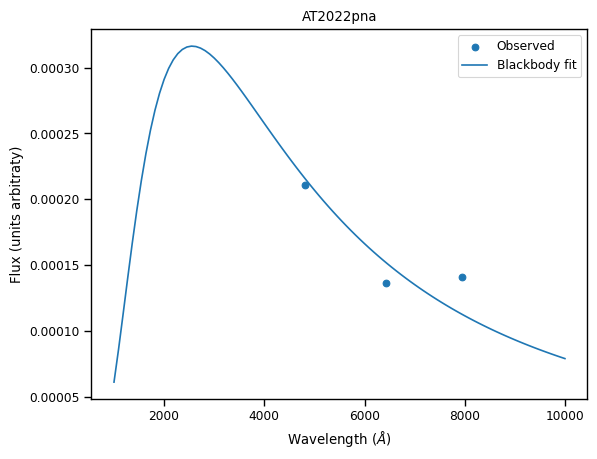

Fit to AT2022pna is 19923.809874221894 degrees K.


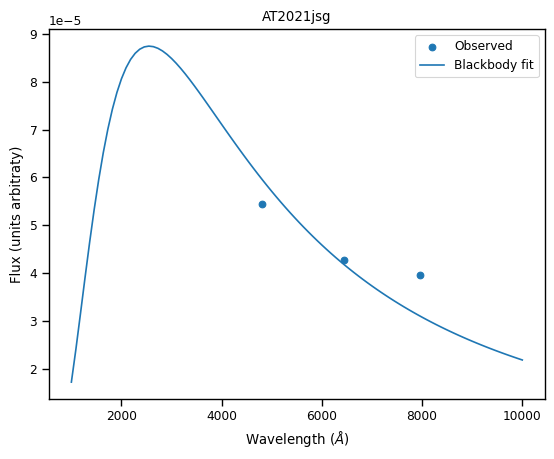

Fit to AT2021jsg is 19980.88574611383 degrees K.


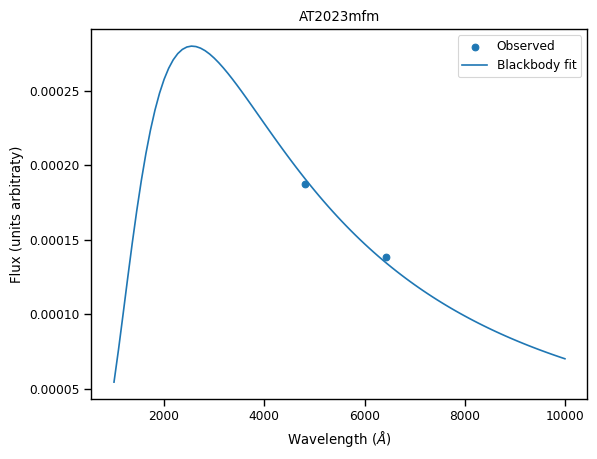

Fit to AT2023mfm is 19931.070944618004 degrees K.


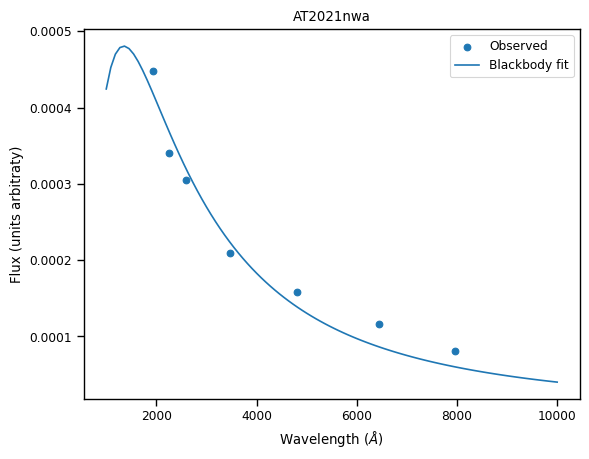

Fit to AT2021nwa is 37844.19607238657 degrees K.


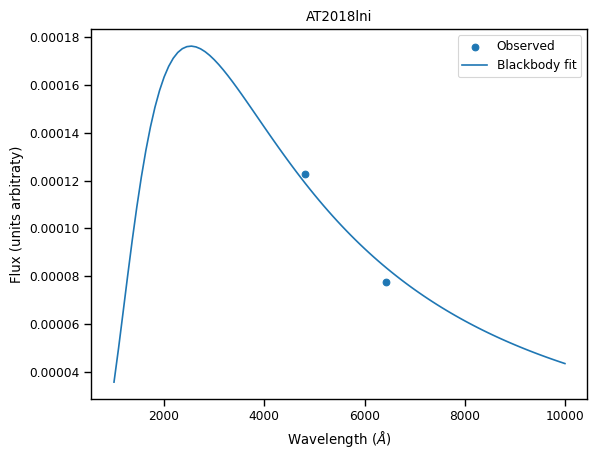

Fit to AT2018lni is 20126.073301502132 degrees K.


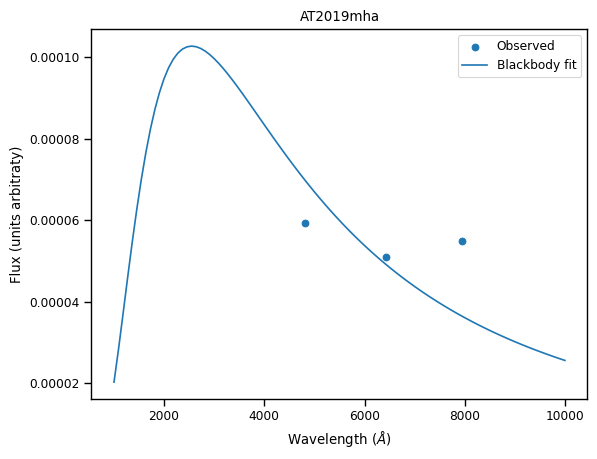

Fit to AT2019mha is 19999.99997991547 degrees K.


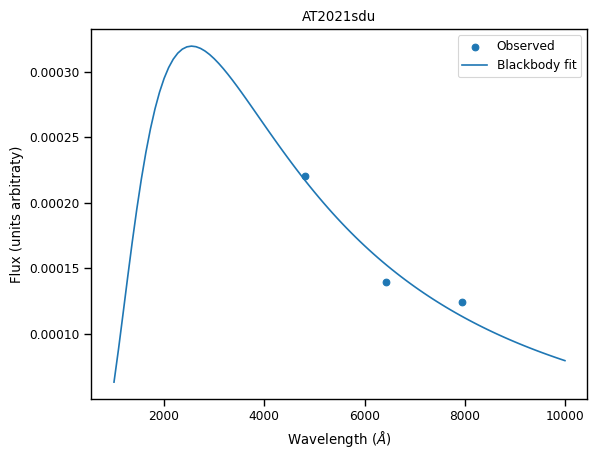

Fit to AT2021sdu is 20007.7198536316 degrees K.


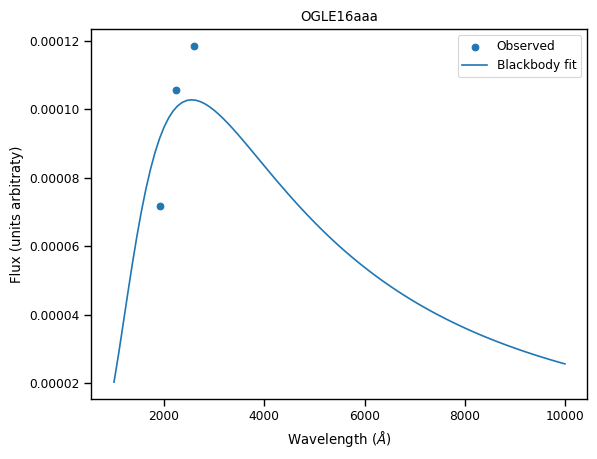

Fit to OGLE16aaa is 20000.0000002156 degrees K.


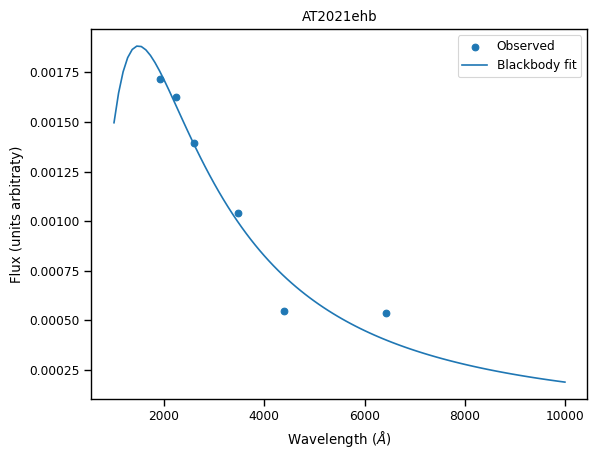

Fit to AT2021ehb is 34282.078033422324 degrees K.


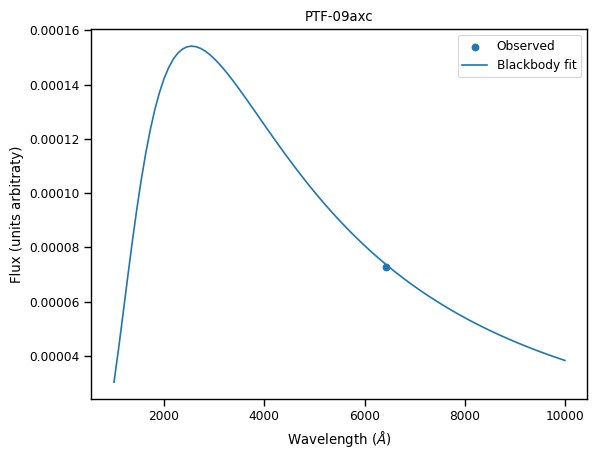

Fit to PTF-09axc is 20000.187083759996 degrees K.


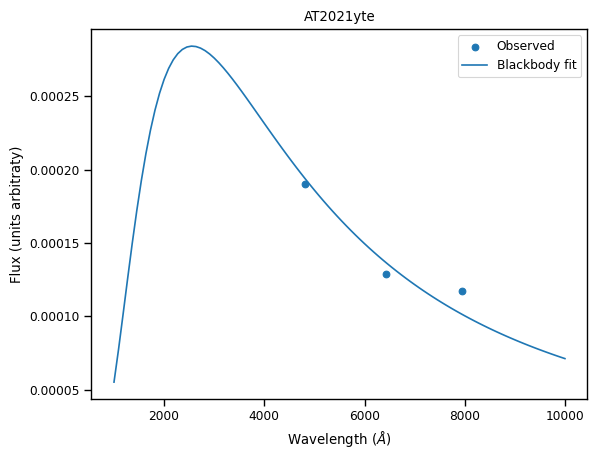

Fit to AT2021yte is 19924.209495062878 degrees K.


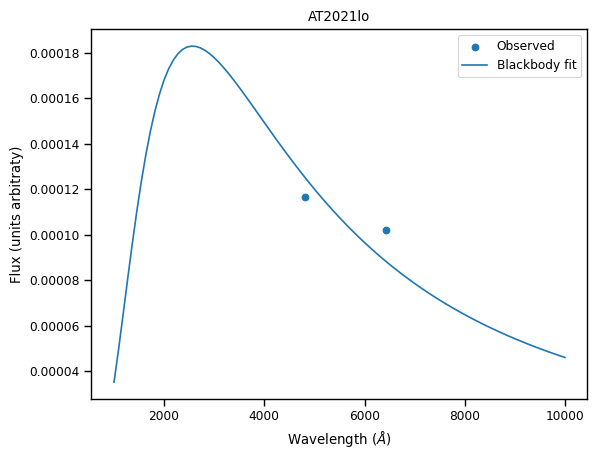

Fit to AT2021lo is 19877.425277656555 degrees K.


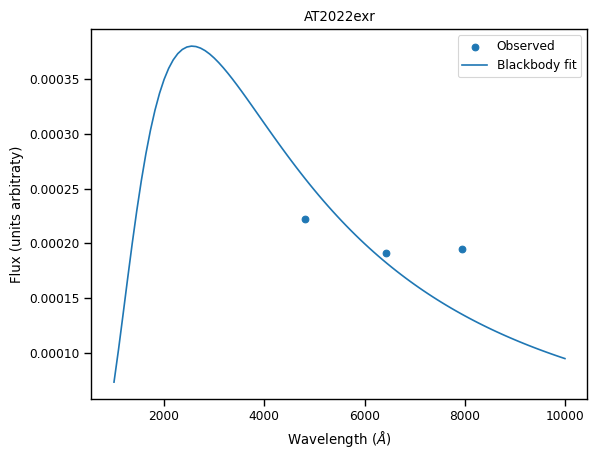

Fit to AT2022exr is 19923.37844326871 degrees K.
No observations near peak for TDE AT2018fyk


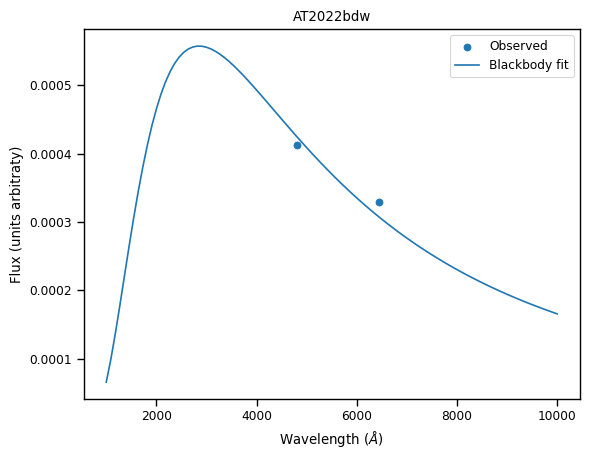

Fit to AT2022bdw is 17878.488792271735 degrees K.


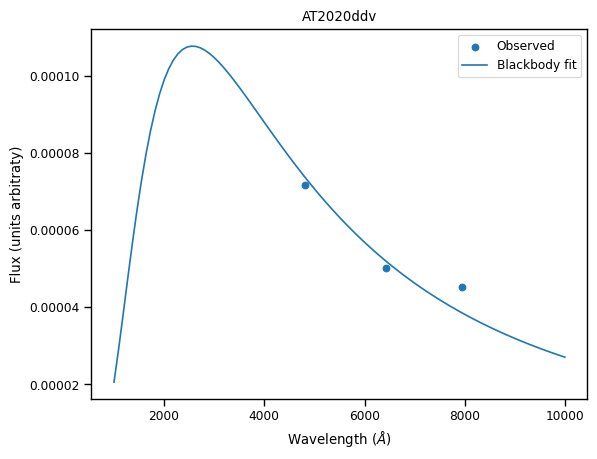

Fit to AT2020ddv is 19865.917417610315 degrees K.


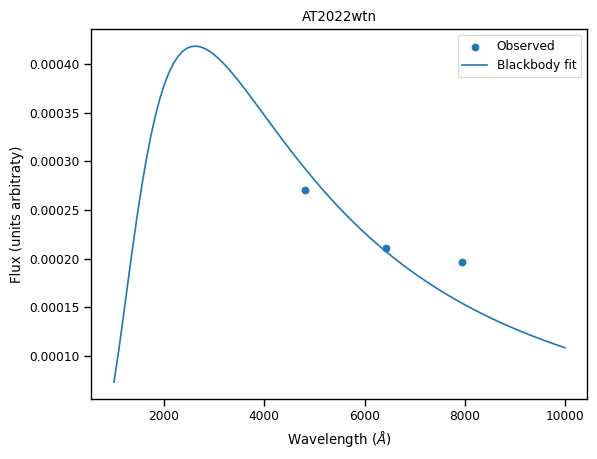

Fit to AT2022wtn is 19464.069715716632 degrees K.


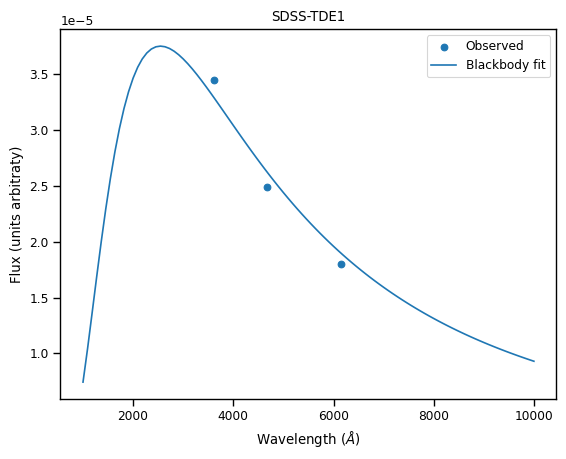

Fit to SDSS-TDE1 is 20032.671898372282 degrees K.


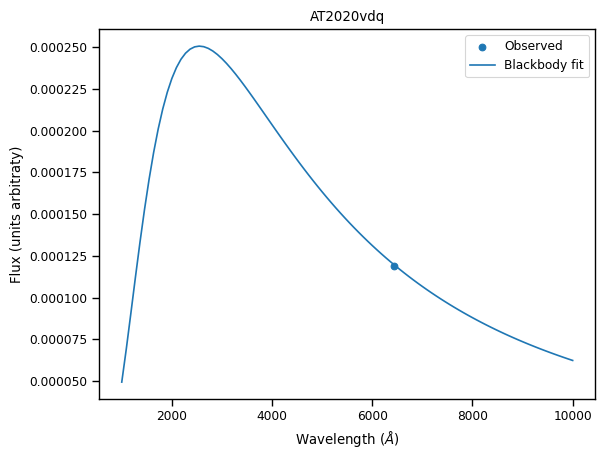

Fit to AT2020vdq is 20000.28646046615 degrees K.


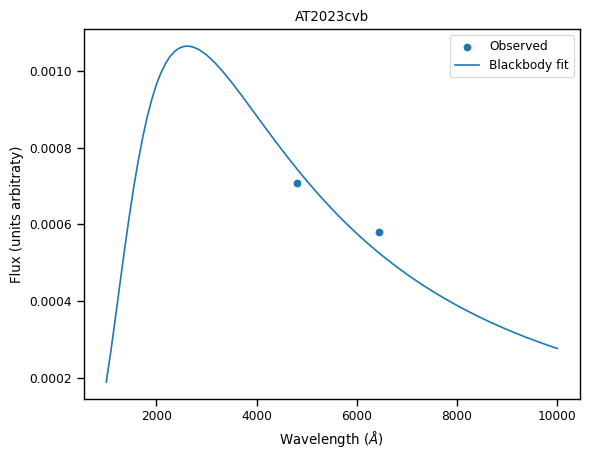

Fit to AT2023cvb is 19496.05595679592 degrees K.


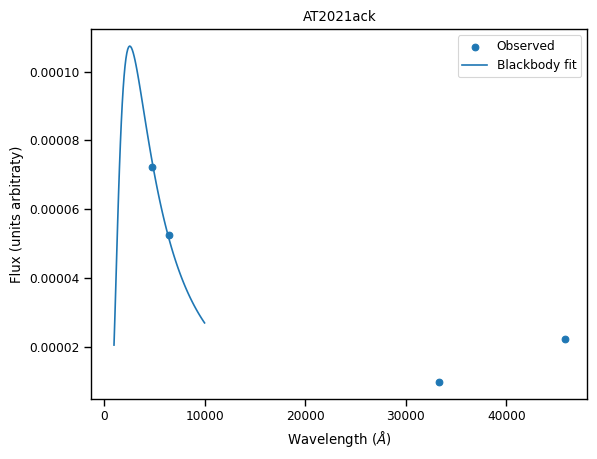

Fit to AT2021ack is 19865.910691021374 degrees K.


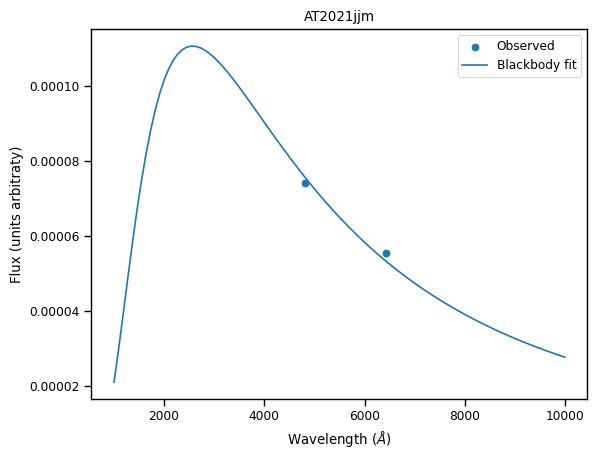

Fit to AT2021jjm is 19865.99415050899 degrees K.


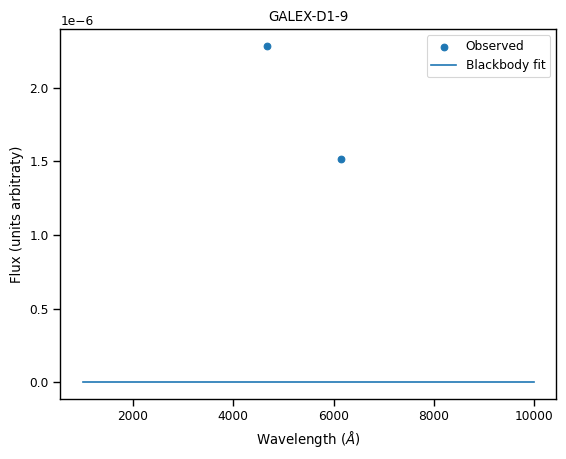

Fit to GALEX-D1-9 is 20000.00001858813 degrees K.


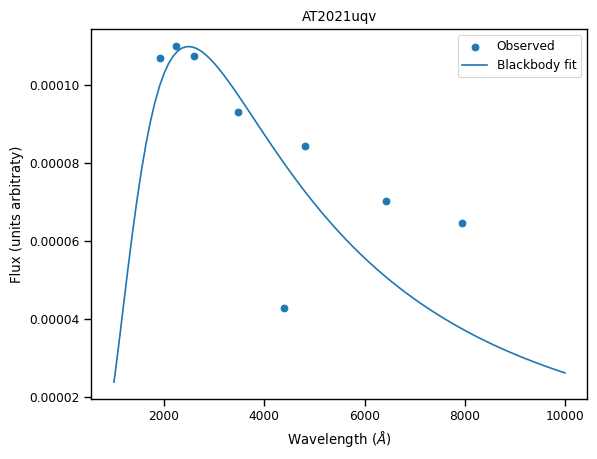

Fit to AT2021uqv is 20493.687138551086 degrees K.


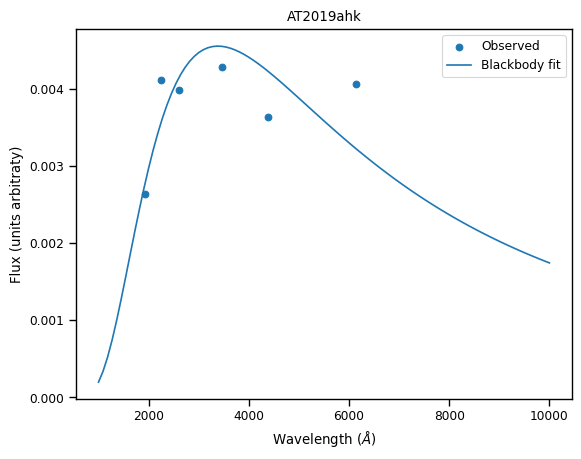

Fit to AT2019ahk is 15073.26330516793 degrees K.
No observations near peak for TDE AT2022gri


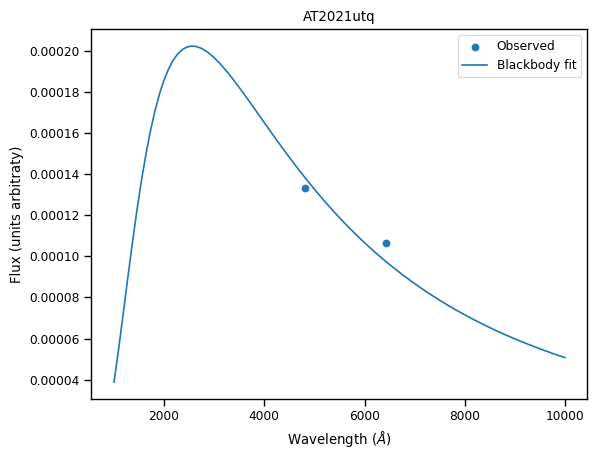

Fit to AT2021utq is 19883.862922499044 degrees K.


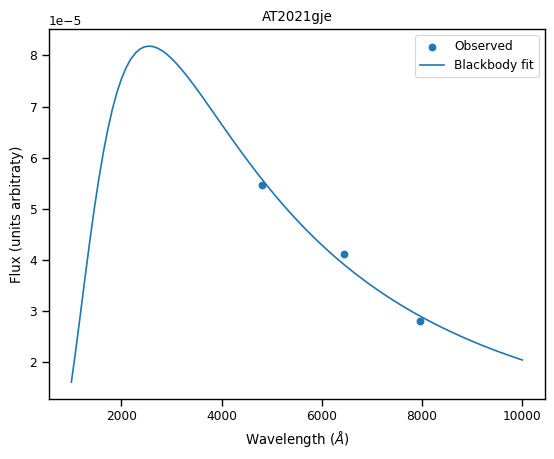

Fit to AT2021gje is 19980.93187662586 degrees K.


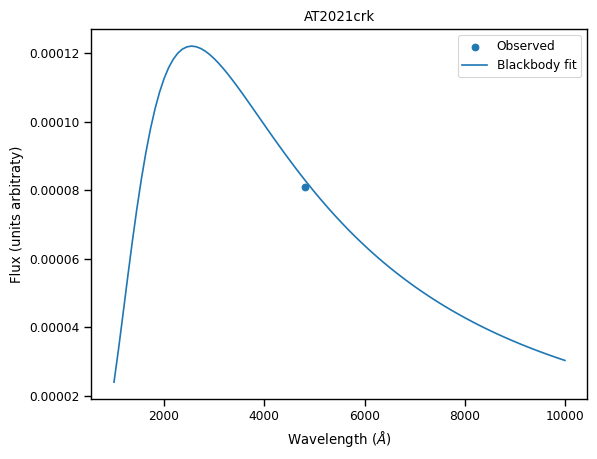

Fit to AT2021crk is 20000.08470502862 degrees K.


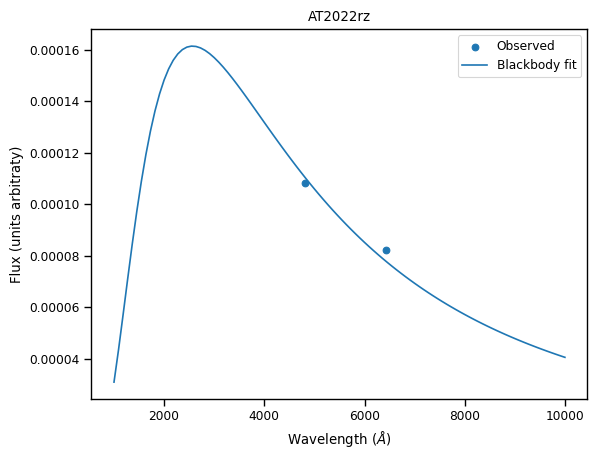

Fit to AT2022rz is 19872.02230789604 degrees K.


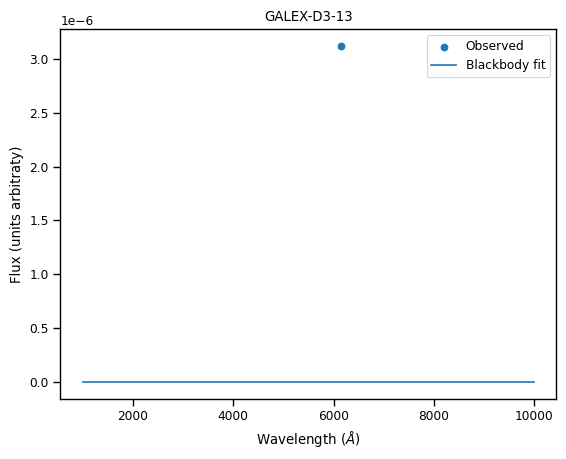

Fit to GALEX-D3-13 is 20000.000006435715 degrees K.


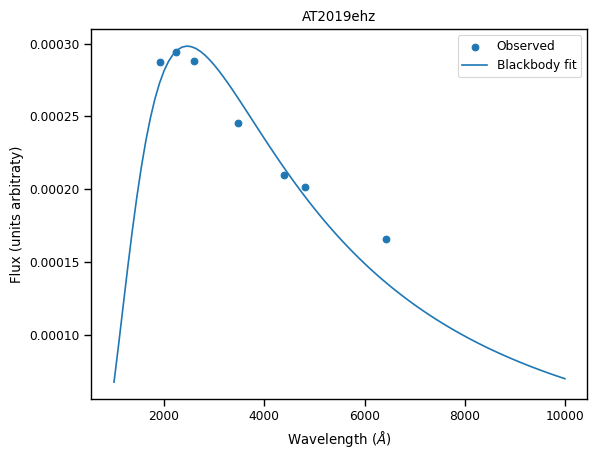

Fit to AT2019ehz is 20714.956059341293 degrees K.
No observations near peak for TDE AT2018iih


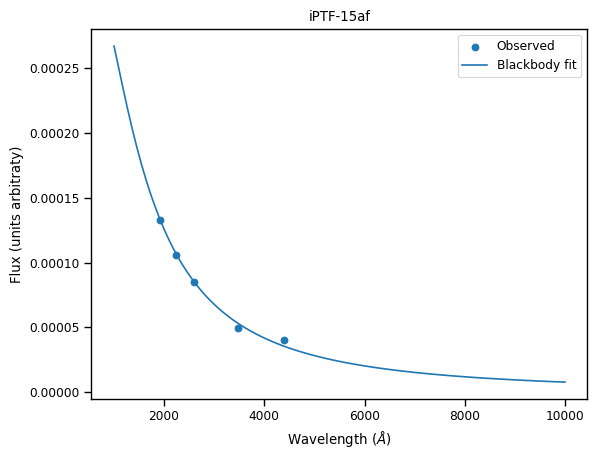

Fit to iPTF-15af is 70638.92265985112 degrees K.


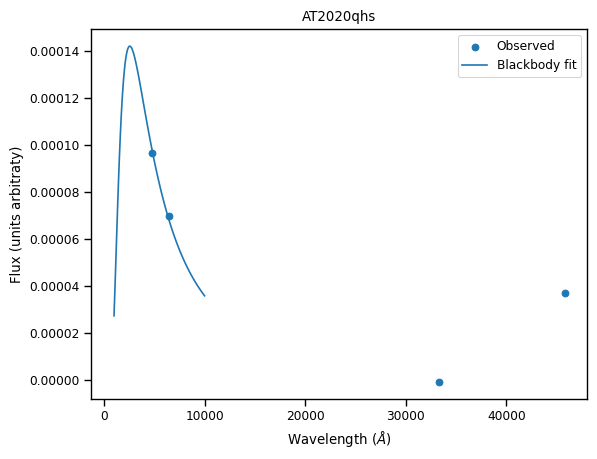

Fit to AT2020qhs is 19868.68346893993 degrees K.


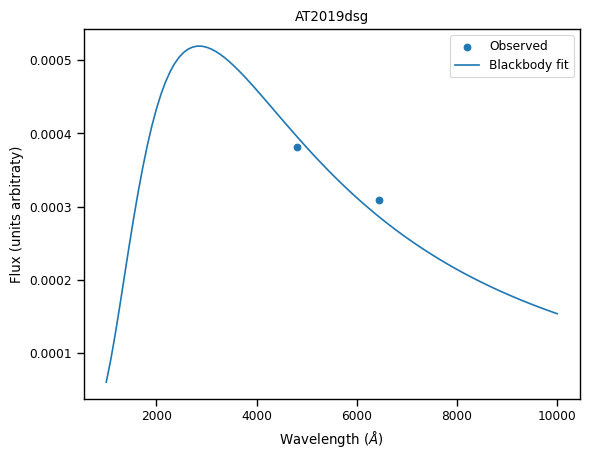

Fit to AT2019dsg is 17870.377831720216 degrees K.


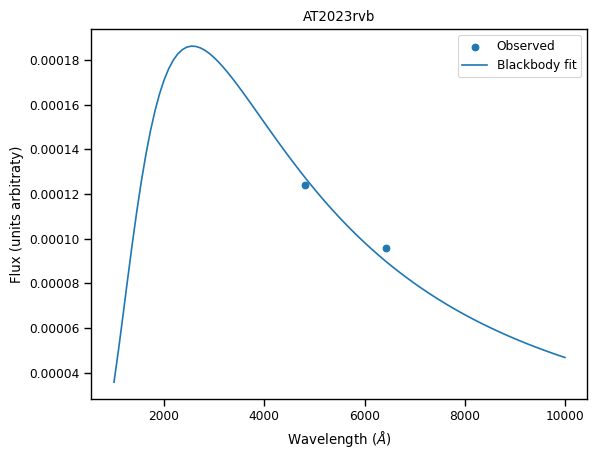

Fit to AT2023rvb is 19878.40122692833 degrees K.


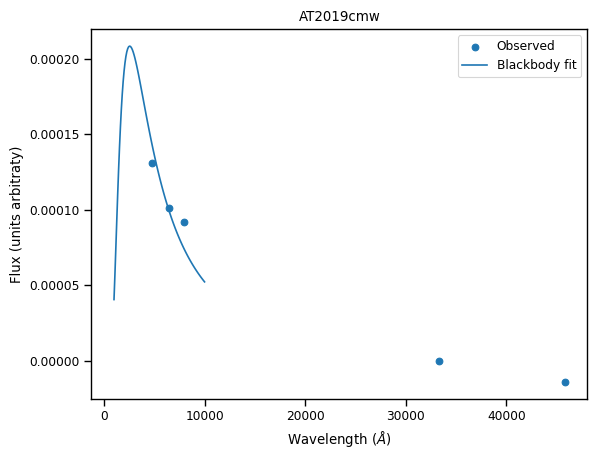

Fit to AT2019cmw is 19925.643103141705 degrees K.


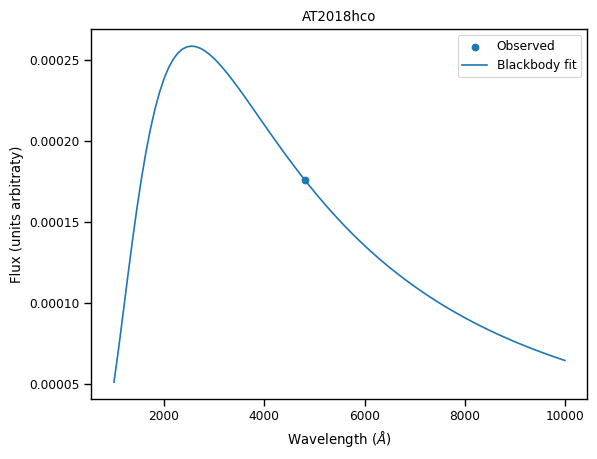

Fit to AT2018hco is 20000.800836372266 degrees K.


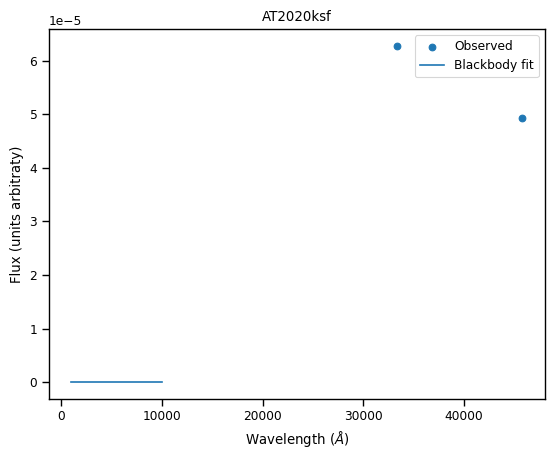

Fit to AT2020ksf is 19999.999982670524 degrees K.


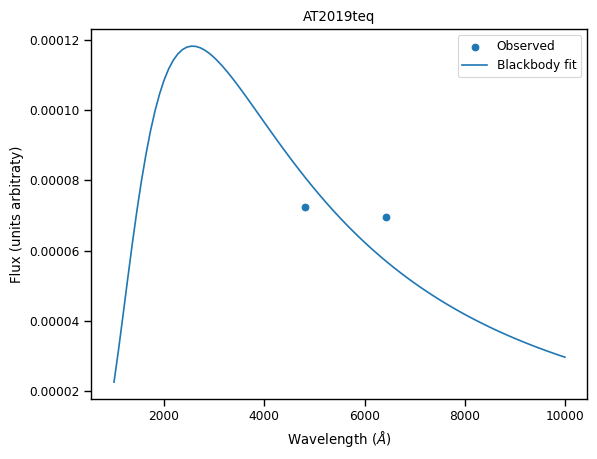

Fit to AT2019teq is 19866.343511810966 degrees K.


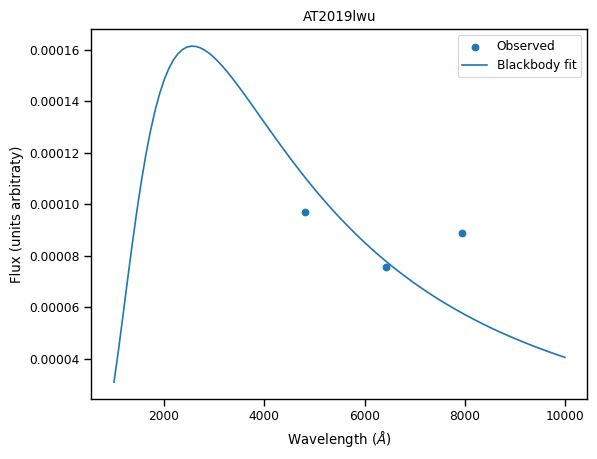

Fit to AT2019lwu is 19872.032511089288 degrees K.


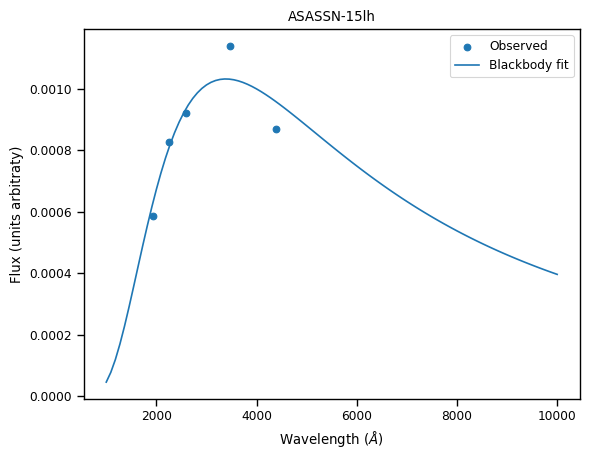

Fit to ASASSN-15lh is 15060.247059866502 degrees K.


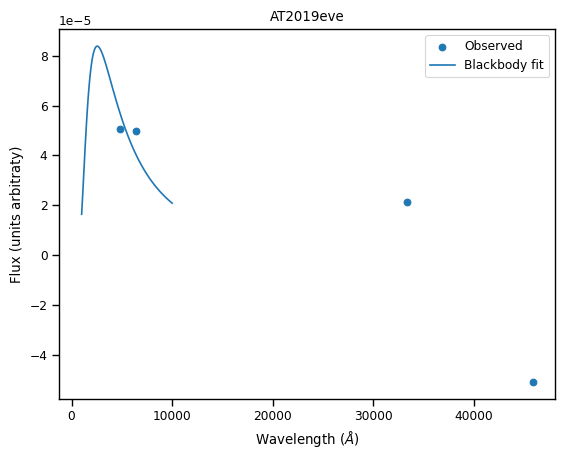

Fit to AT2019eve is 19980.914106997123 degrees K.
No observations near peak for TDE SDSS-TDE2


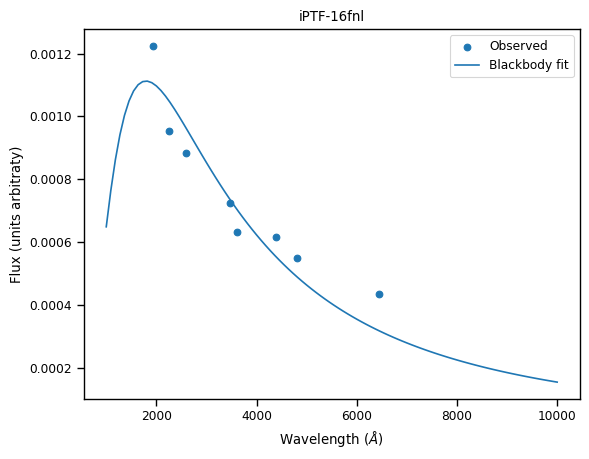

Fit to iPTF-16fnl is 28451.285632767514 degrees K.


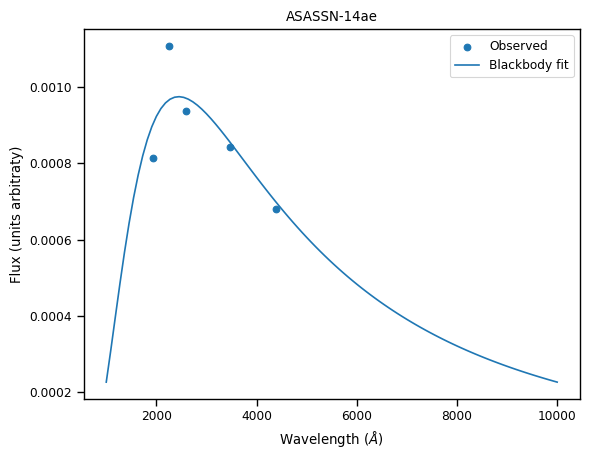

Fit to ASASSN-14ae is 20842.338389872366 degrees K.


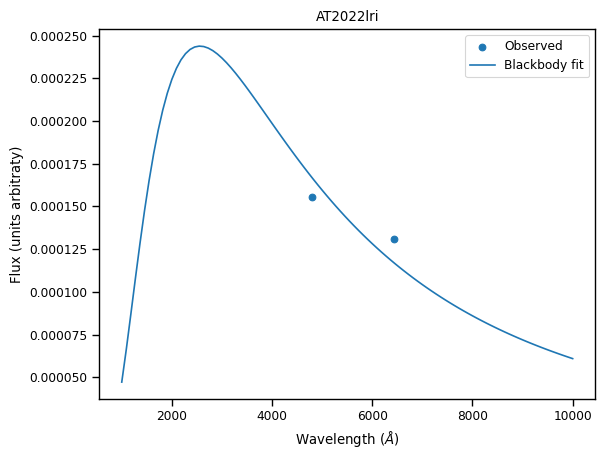

Fit to AT2022lri is 19924.888083016056 degrees K.


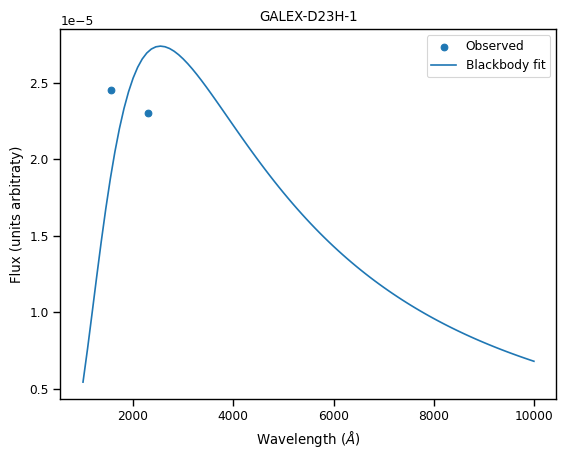

Fit to GALEX-D23H-1 is 20033.524960747753 degrees K.


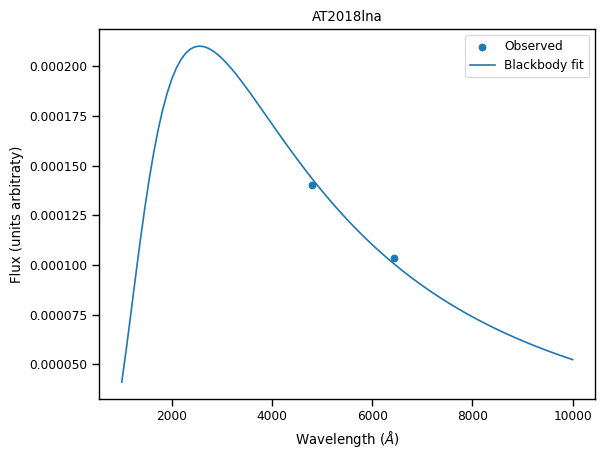

Fit to AT2018lna is 19965.95346561633 degrees K.


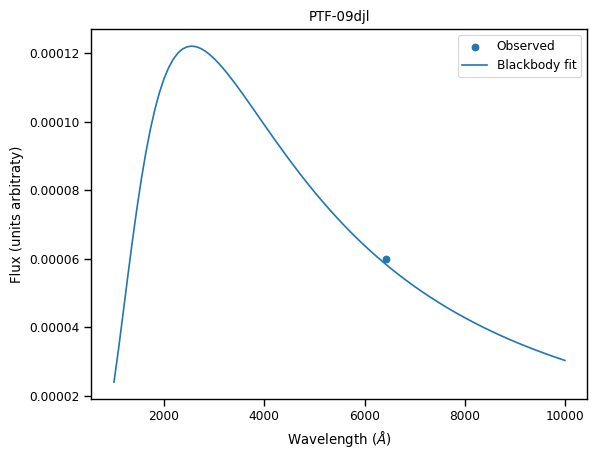

Fit to PTF-09djl is 20000.07302752886 degrees K.


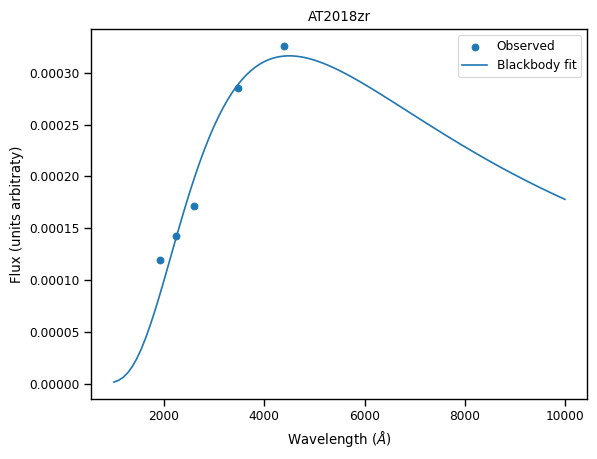

Fit to AT2018zr is 11339.181013008654 degrees K.


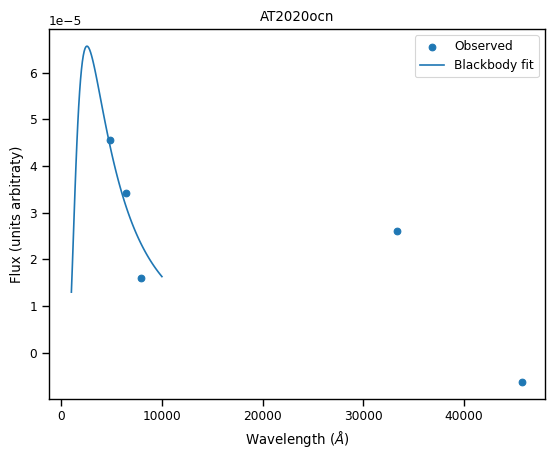

Fit to AT2020ocn is 20018.847468231503 degrees K.


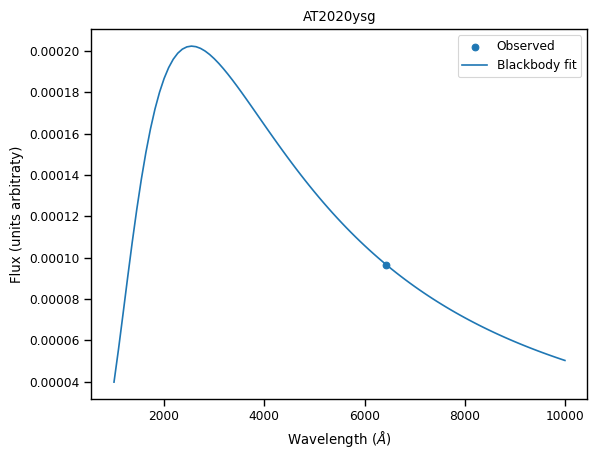

Fit to AT2020ysg is 20000.475164905678 degrees K.


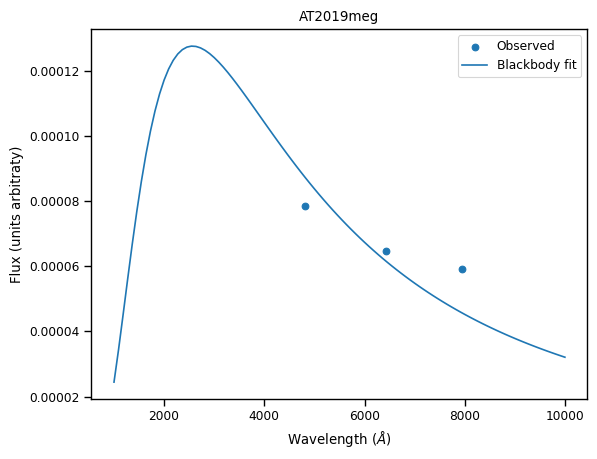

Fit to AT2019meg is 19867.033319736052 degrees K.


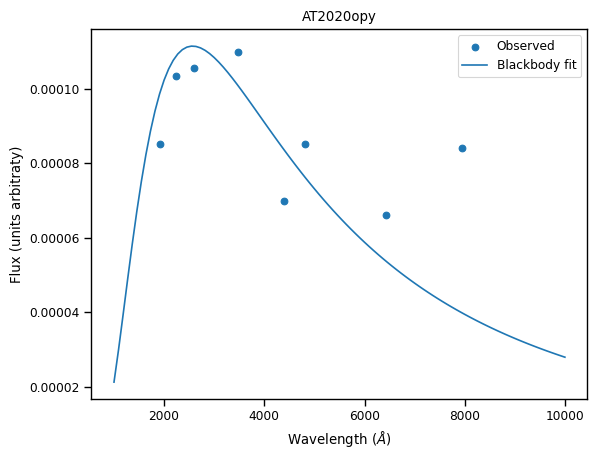

Fit to AT2020opy is 19866.025004893323 degrees K.


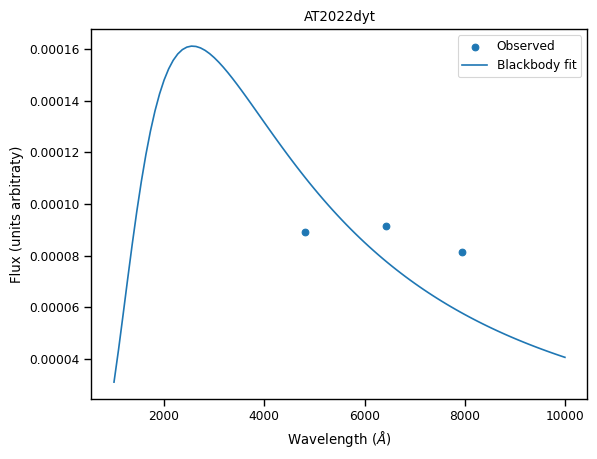

Fit to AT2022dyt is 19872.002388027748 degrees K.


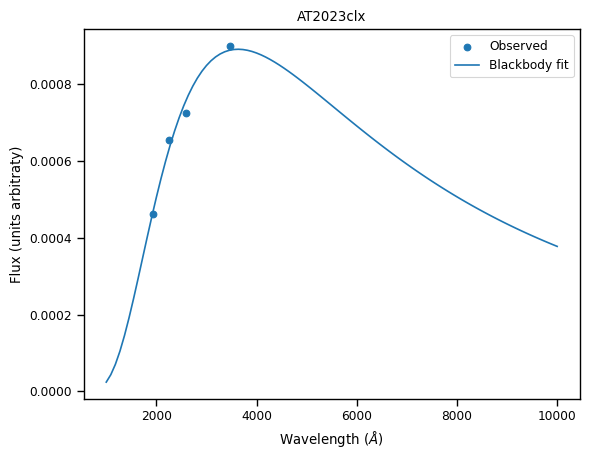

Fit to AT2023clx is 14042.956465213854 degrees K.


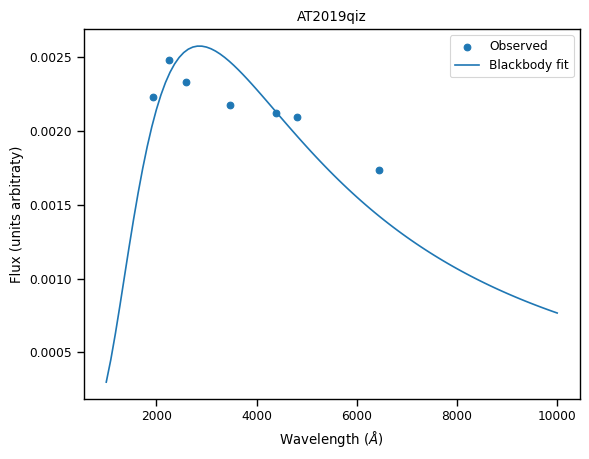

Fit to AT2019qiz is 17835.642554376267 degrees K.


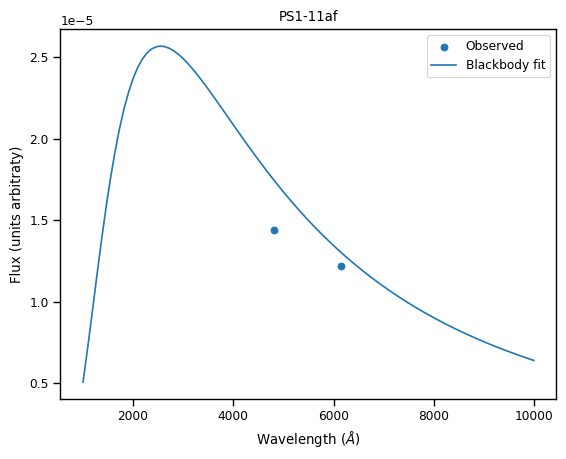

Fit to PS1-11af is 19999.999995708888 degrees K.
No observations near peak for TDE AT2017eqx


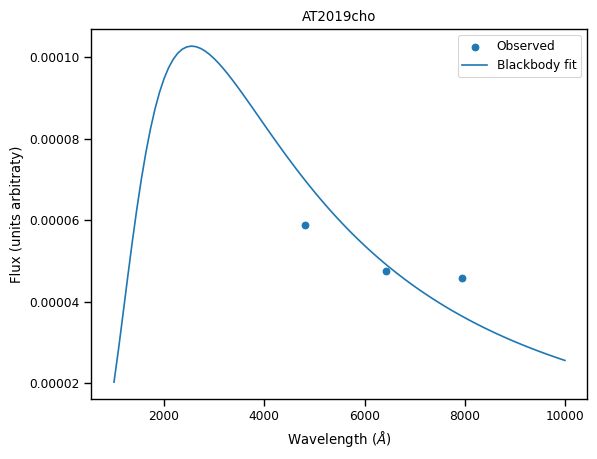

Fit to AT2019cho is 19999.99997991547 degrees K.


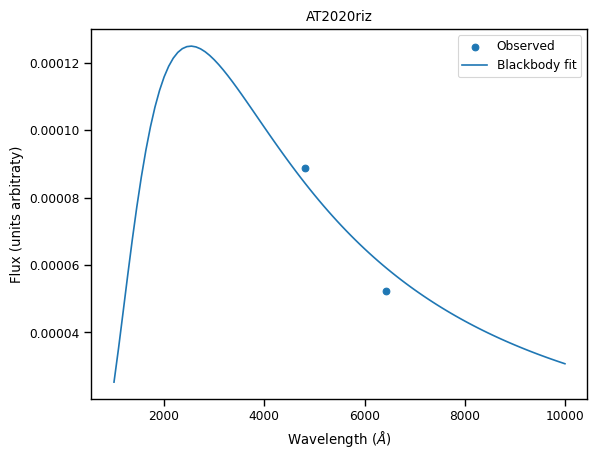

Fit to AT2020riz is 20133.548461749047 degrees K.


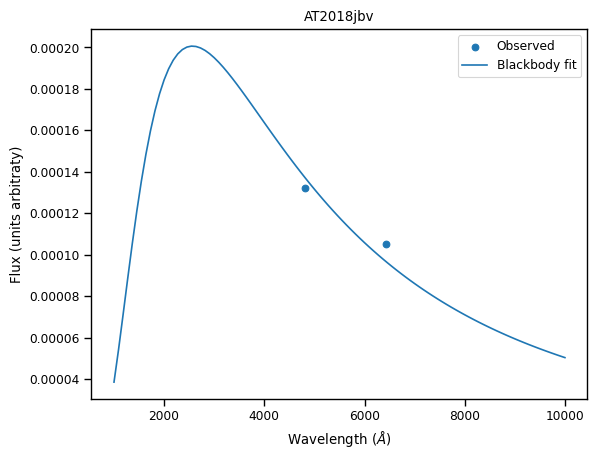

Fit to AT2018jbv is 19883.31028314156 degrees K.


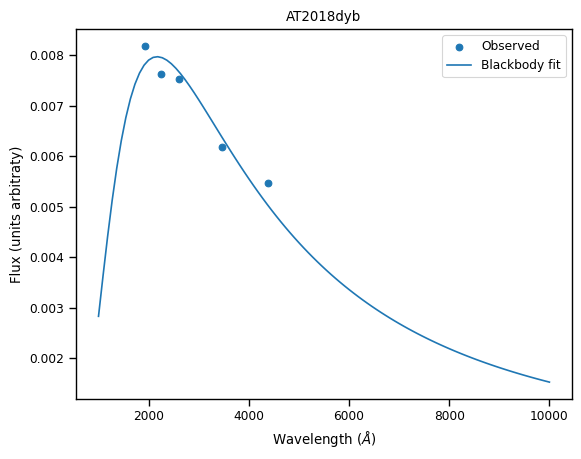

Fit to AT2018dyb is 23497.26759679707 degrees K.


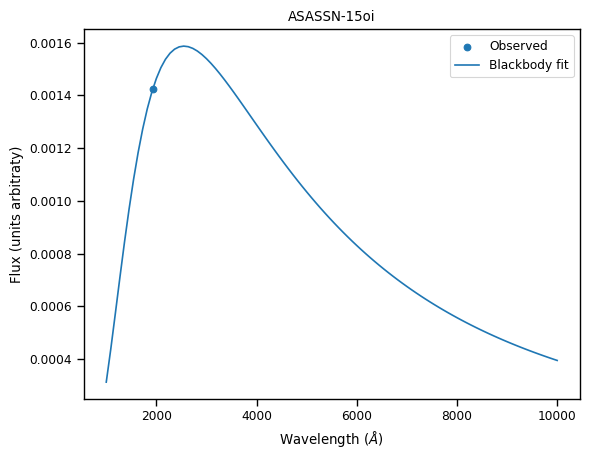

Fit to ASASSN-15oi is 19999.842638239665 degrees K.


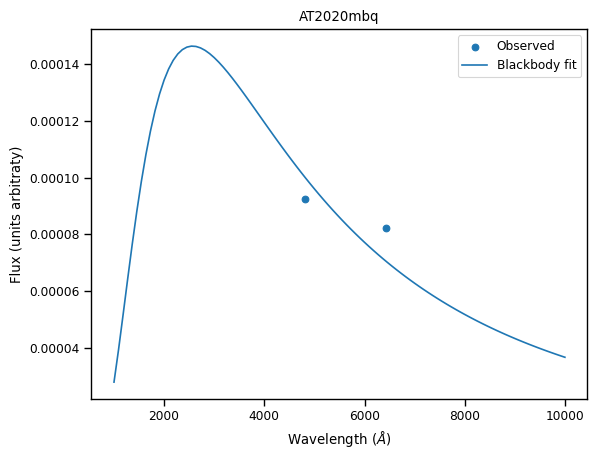

Fit to AT2020mbq is 19869.297224601083 degrees K.


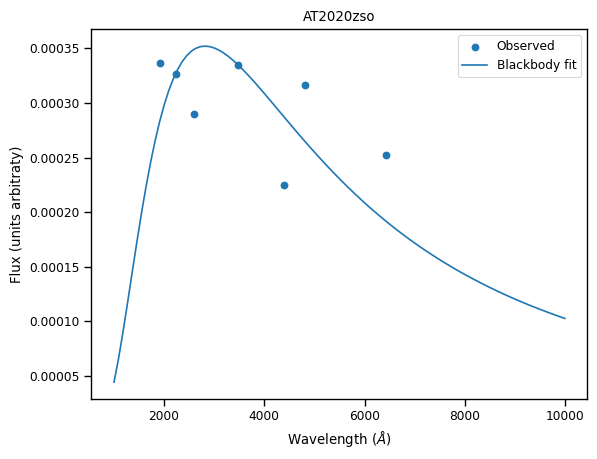

Fit to AT2020zso is 18107.22484661649 degrees K.


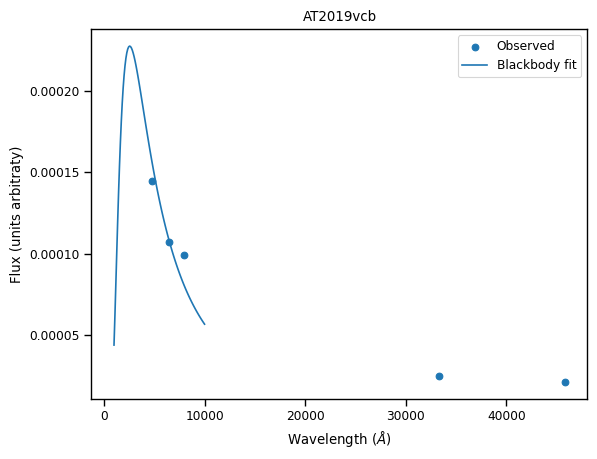

Fit to AT2019vcb is 19925.218976175725 degrees K.


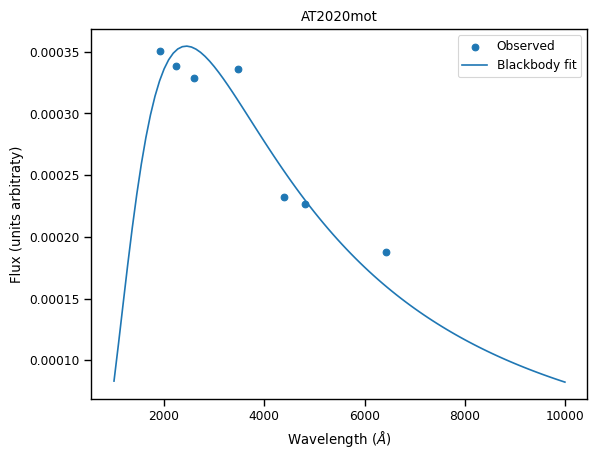

Fit to AT2020mot is 20881.433014497692 degrees K.


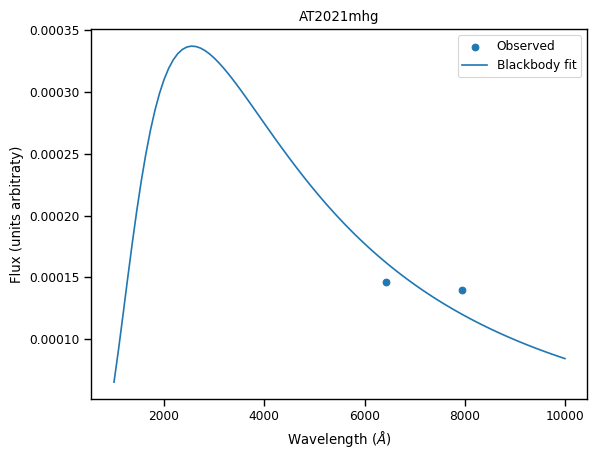

Fit to AT2021mhg is 19923.616537411282 degrees K.


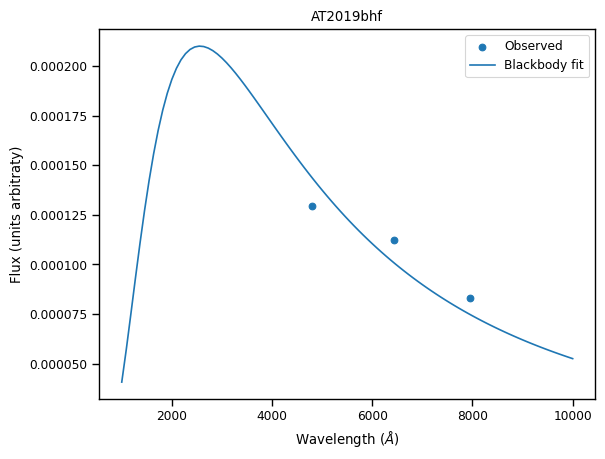

Fit to AT2019bhf is 19925.60937264727 degrees K.


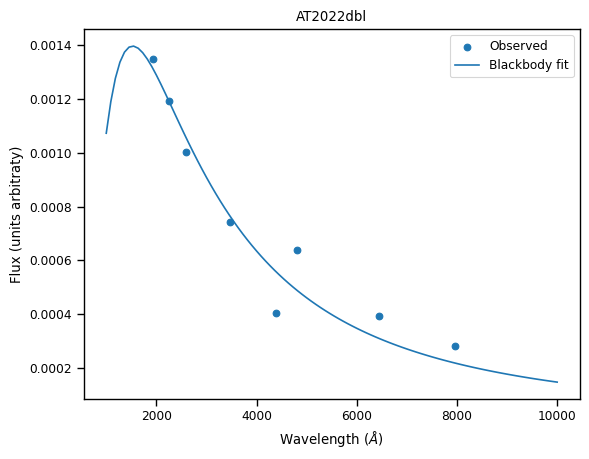

Fit to AT2022dbl is 33405.47111934868 degrees K.


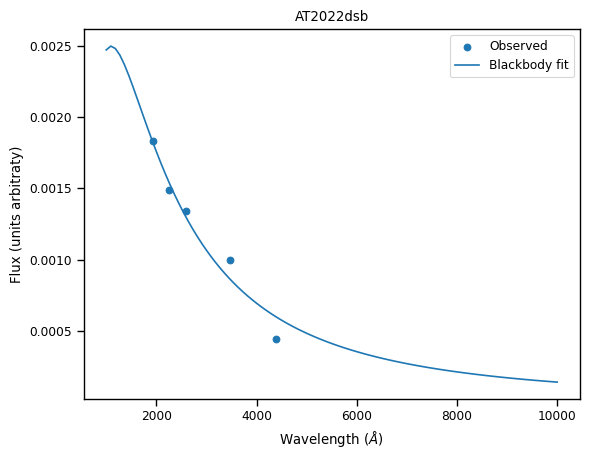

Fit to AT2022dsb is 46524.24271308179 degrees K.


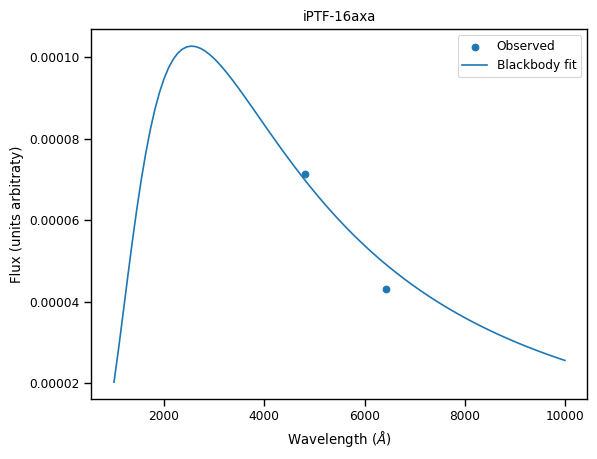

Fit to iPTF-16axa is 19999.999979289427 degrees K.


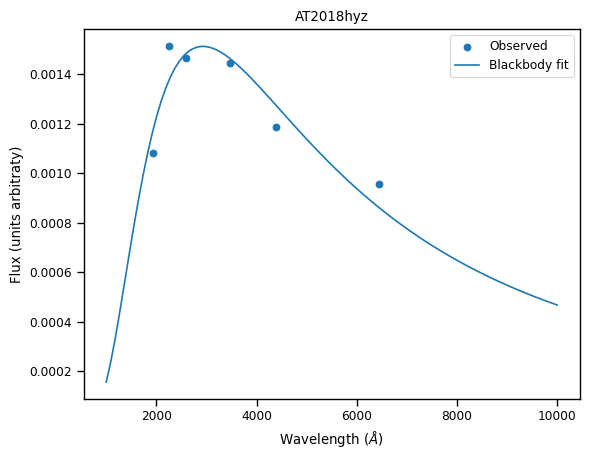

Fit to AT2018hyz is 17419.513274196353 degrees K.


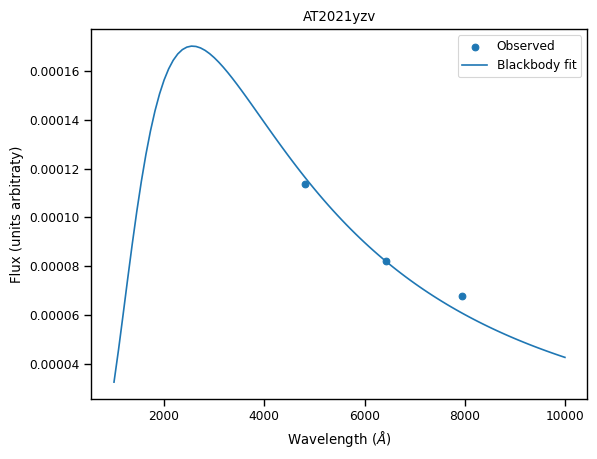

Fit to AT2021yzv is 19873.99954794057 degrees K.


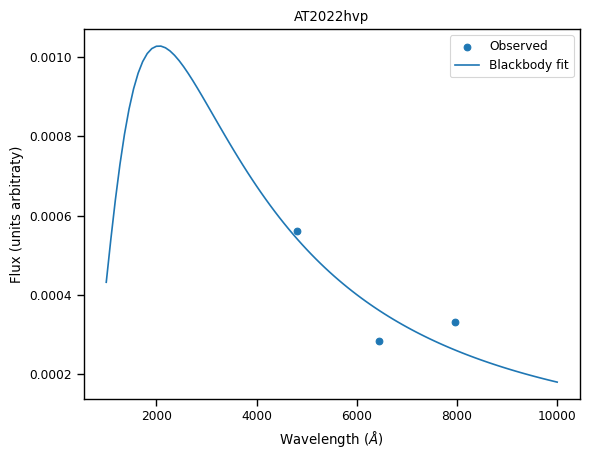

Fit to AT2022hvp is 24859.72476787056 degrees K.


In [7]:
for tde in tde_names:
    t = get_temperature(tde,plotting=True)
    temperatures[tde] = t
    if t:
    	print(f'Fit to {tde} is {t} degrees K.')
    else:
    	print(f'No observations near peak for TDE {tde}')


In [8]:
import george as ge
from george import kernels
from george.metrics import Metric


In [9]:
lc_color_dict = {}
for surv in ['ztf','ps','sdss']:
  lc_color_dict['g.'+surv] = 'g'
  lc_color_dict['r.'+surv] = 'r'
  lc_color_dict['i.'+surv] = 'brown'

lc_color_dict['UVW2.uvot'] = 'violet'
lc_color_dict['UVM2.uvot'] = 'black'
lc_color_dict['UVW1.uvot'] = 'fuchsia'

lc_color_dict['U.uvot'] = 'pink'
lc_color_dict['u.sdss'] = 'darkblue'

lc_color_dict['F125LP'] = 'darkred'
lc_color_dict['F150LP'] = 'darkviolet'
lc_color_dict['F225W'] = 'crimson'

lc_color_dict['FUV'] = 'darkviolet'
lc_color_dict['NUV'] = 'darkkhaki'

lc_color_dict['B.uvot'] = 'lightblue'
lc_color_dict['V.uvot'] = 'orange'
lc_color_dict['c.atlas'] = 'cyan'
lc_color_dict['o.atlas'] = 'orange'
lc_color_dict['W1.wise'] = 'peru'
lc_color_dict['W2.wise'] = 'slategrey'

marker_dict = {key:'o' for key in lc_color_dict}
marker_dict['UVW1.uvot'] = 's'
marker_dict['UVM2.uvot'] = 's'
marker_dict['UVW2.uvot'] = 's'

marker_dict['r.ztf'] = 's'

marker_dict['F125LP'] = '*'
marker_dict['F150LP'] = 'd'
marker_dict['F225W'] = '*'


/Users/snorris/.conda/envs/TDE/lib/python3.12/site-packages/astropy/units/function/logarithmic.py:66: RuntimeWarning: invalid value encountered in log10
  return dex.to(self._function_unit, np.log10(x))
/Users/snorris/.conda/envs/TDE/lib/python3.12/site-packages/astropy/units/function/logarithmic.py:66: RuntimeWarning: divide by zero encountered in log10
  return dex.to(self._function_unit, np.log10(x))
/Users/snorris/.conda/envs/TDE/lib/python3.12/site-packages/astropy/units/quantity.py:666: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/Users/snorris/.conda/envs/TDE/lib/python3.12/site-packages/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in add
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


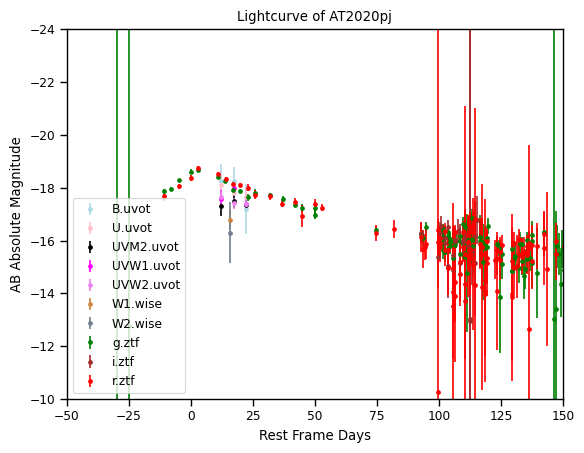

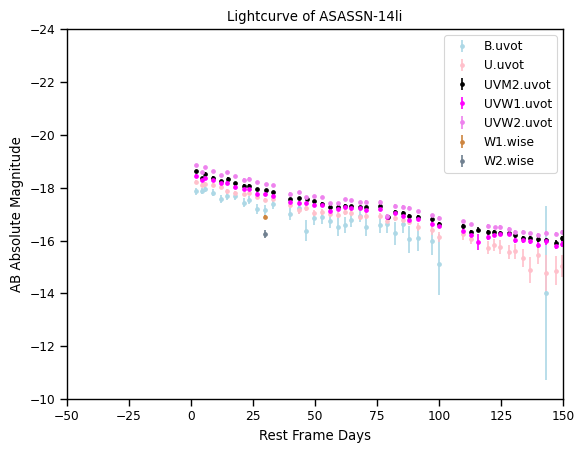

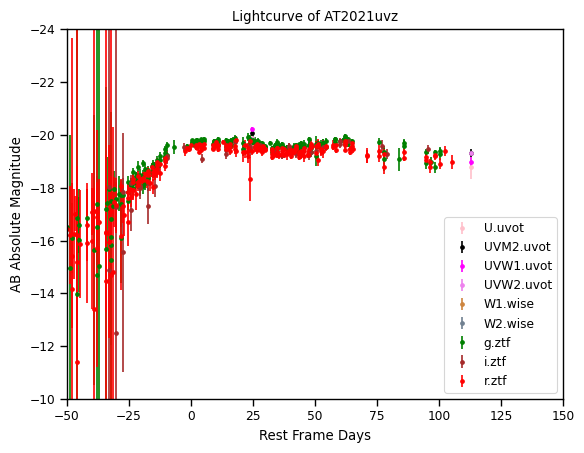

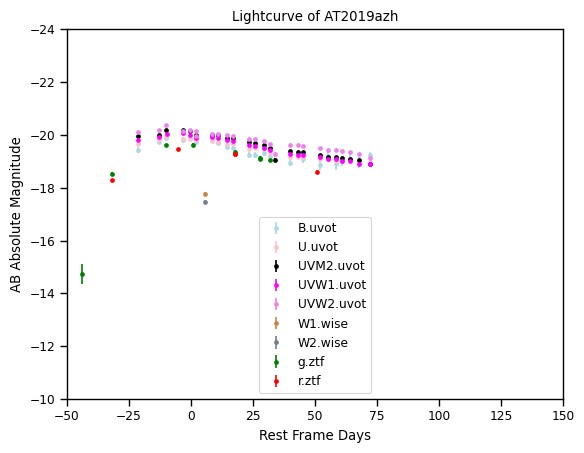

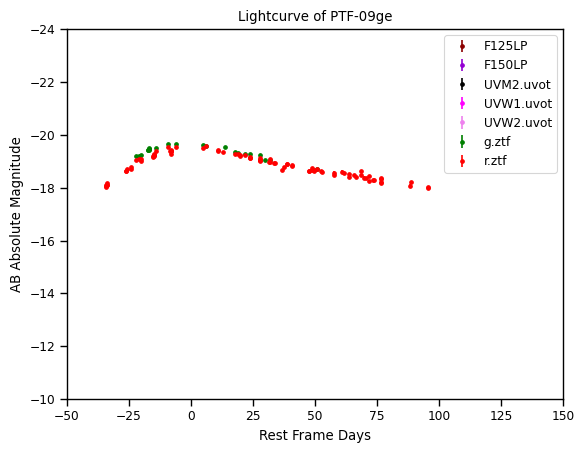

...

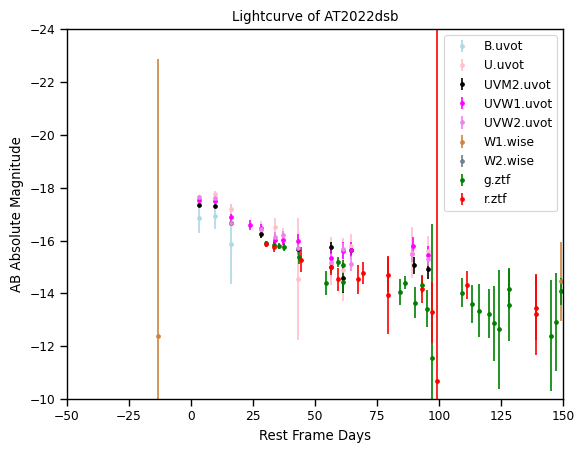

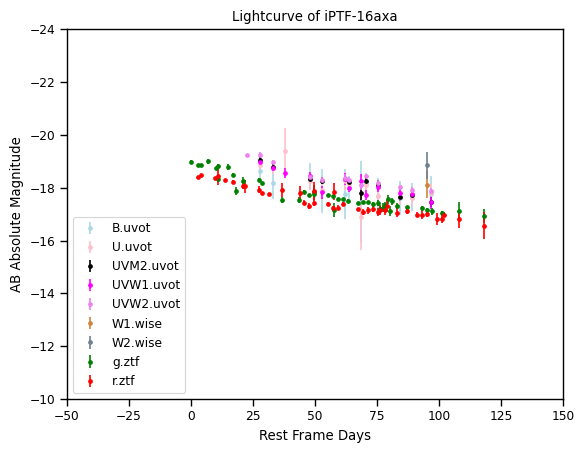

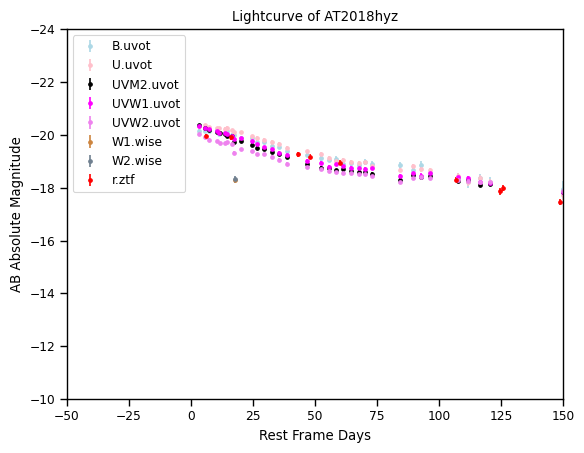

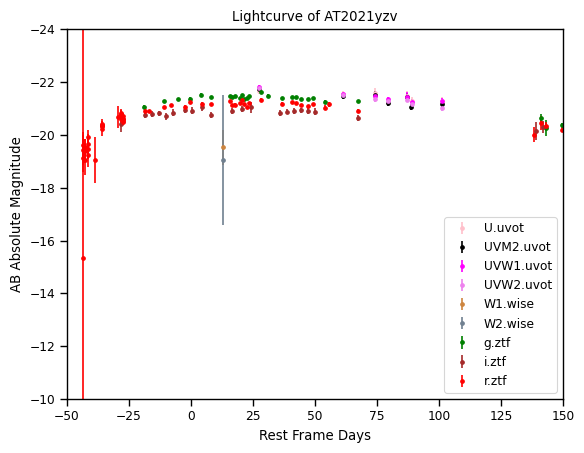

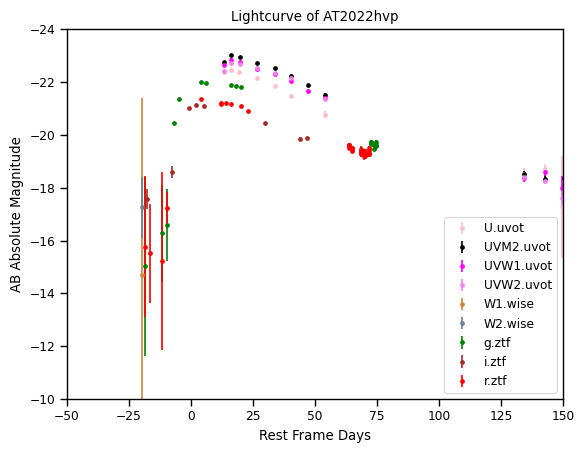

In [10]:
from astropy.cosmology import WMAP9 as cosmo
Ho = cosmo.H(0)  
from astropy.constants import c
from astropy.constants import e
sol = c.to(u.km/u.s)
def plot_lightcurve(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    flux_filter = []
    mag_filter = []
    absMag_filter = []
    error_filter = []
    flux_error_filter = []
    mag_error_filter = []
    mjd_date_filter = []
    peak_date_filter = []
    rest_time_filter = []
    lc_filters = tde_data['lightcurve']['filters']
    peak_year = tde_data.get('peak_mjd')
    distance = (sol*tde_data.get('z'))/Ho         
    distance_pc = distance.to(u.pc)
    distance_mod = (5*np.log10(distance_pc/(10*u.pc)))
    for element in lc_filters: 
        filter_list = np.array([f[1] for f in tde_data['lightcurve']['data']])
        i_filter = np.where(filter_list == element)[0]
        flux_filter = np.array(tde_data['lightcurve']["data"])[i_filter,2]
        error_filter = np.array(tde_data['lightcurve']["data"])[i_filter,3]
        mjd_date_filter = np.array(tde_data['lightcurve']["data"])[i_filter,0]
        flux_filter = np.array(flux_filter, dtype=float)*u.Jy
        mag_filter = flux_filter.to(u.ABmag)     
        absMag_filter = mag_filter.value - distance_mod
        flux_error_filter = u.Jy * np.array(error_filter, dtype=float)
        mjd_date_filter= np.array(mjd_date_filter, dtype=float)
        peak_date_filter = mjd_date_filter - peak_year
        rest_time_filter = peak_date_filter*np.sqrt(1-tde_data.get('z')**2)
        mag_error_filter = np.sqrt((2.5/np.log(10))*(flux_error_filter/flux_filter)**2) 
        lightcurve = plt.errorbar(rest_time_filter,absMag_filter,yerr = mag_error_filter,fmt='.',label= element, c = lc_color_dict[element])
        plt.gca().invert_yaxis()
        plt.xlim(-50,150)
        plt.ylim(-10,-24)
        plt.legend()
        plt.xlabel("Rest Frame Days")
        plt.ylabel("AB Absolute Magnitude")
        plt.legend()
        plt.title("Lightcurve of {}".format(tde_name))
    #plt.savefig('SED and Lightcurve Folder/Lightcurve of {}'.format(tde_name) + '.pdf')
    plt.show()
    return(lightcurve)
for json_file in json_list[:]:
    tde_name = json_file[:-5]
    plot_lightcurve(tde_name) 

In [11]:
def y_flux(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    flux_filter = []
    mag_filter = []
    absMag_filter = []
    error_filter = []
    flux_error_filter = []
    mag_error_filter = []
    mjd_date_filter = []
    peak_date_filter = []
    rest_time_filter = []
    lc_filters = tde_data['lightcurve']['filters']
    peak_year = tde_data.get('peak_mjd')
    distance = (sol*tde_data.get('z'))/Ho         
    distance_pc = distance.to(u.pc)
    distance_mod = (5*np.log10(distance_pc/(10*u.pc)))
    y_flux_list = []
    for element in lc_filters: 
        filter_list = np.array([f[1] for f in tde_data['lightcurve']['data']])
        i_filter = np.where(filter_list == element)[0]
        flux_filter = np.array(tde_data['lightcurve']["data"])[i_filter,2]
        error_filter = np.array(tde_data['lightcurve']["data"])[i_filter,3]
        mjd_date_filter = np.array(tde_data['lightcurve']["data"])[i_filter,0]
        flux_filter = np.array(flux_filter, dtype=float)*u.Jy
        flux_error_filter = u.Jy * np.array(error_filter, dtype=float)
        mjd_date_filter= np.array(mjd_date_filter, dtype=float)
        peak_date_filter = mjd_date_filter - peak_year
        rest_time_filter = peak_date_filter*np.sqrt(1-tde_data.get('z')**2)
        y_flux_list.append(flux_filter.to_value())
    return(y_flux_list)
def x_rest_time(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    flux_filter = []
    mag_filter = []
    absMag_filter = []
    error_filter = []
    flux_error_filter = []
    mag_error_filter = []
    mjd_date_filter = []
    peak_date_filter = []
    rest_time_filter = []
    lc_filters = tde_data['lightcurve']['filters']
    peak_year = tde_data.get('peak_mjd')
    distance = (sol*tde_data.get('z'))/Ho         
    distance_pc = distance.to(u.pc)
    distance_mod = (5*np.log10(distance_pc/(10*u.pc)))
    time_list = []
    for element in lc_filters: 
        filter_list = np.array([f[1] for f in tde_data['lightcurve']['data']])
        i_filter = np.where(filter_list == element)[0]
        flux_filter = np.array(tde_data['lightcurve']["data"])[i_filter,2]
        error_filter = np.array(tde_data['lightcurve']["data"])[i_filter,3]
        mjd_date_filter = np.array(tde_data['lightcurve']["data"])[i_filter,0]
        flux_filter = np.array(flux_filter, dtype=float)*u.Jy
        flux_error_filter = u.Jy * np.array(error_filter, dtype=float)
        mjd_date_filter= np.array(mjd_date_filter, dtype=float)
        peak_date_filter = mjd_date_filter - peak_year
        rest_time_filter = peak_date_filter*np.sqrt(1-tde_data.get('z')**2)
        time_list.append(rest_time_filter)
    return(time_list)
#print(len(x_rest_time('ASASSN-14li')))
def y_flux_error(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    flux_filter = []
    mag_filter = []
    absMag_filter = []
    error_filter = []
    flux_error_filter = []
    mag_error_filter = []
    mjd_date_filter = []
    peak_date_filter = []
    rest_time_filter = []
    lc_filters = tde_data['lightcurve']['filters']
    peak_year = tde_data.get('peak_mjd')
    distance = (sol*tde_data.get('z'))/Ho         
    distance_pc = distance.to(u.pc)
    distance_mod = (5*np.log10(distance_pc/(10*u.pc)))
    e_flux_list = []
    for element in lc_filters: 
        filter_list = np.array([f[1] for f in tde_data['lightcurve']['data']])
        i_filter = np.where(filter_list == element)[0]
        flux_filter = np.array(tde_data['lightcurve']["data"])[i_filter,2]
        error_filter = np.array(tde_data['lightcurve']["data"])[i_filter,3]
        mjd_date_filter = np.array(tde_data['lightcurve']["data"])[i_filter,0]
        flux_filter = np.array(flux_filter, dtype=float)*u.Jy
        flux_error_filter = u.Jy * np.array(error_filter, dtype=float)
        mjd_date_filter= np.array(mjd_date_filter, dtype=float)
        peak_date_filter = mjd_date_filter - peak_year
        rest_time_filter = peak_date_filter*np.sqrt(1-tde_data.get('z')**2)
        e_flux_list.append(flux_error_filter.to_value())
    return(flux_error_filter.to_value())
#print(y_flux_error('ASASSN-14li'))


In [49]:
x_rest_time('ASASSN-14li')


[array([1.99323149e+00, 4.45079300e+00, 5.84375798e+00, 8.78346238e+00,
        1.21682275e+01, 1.47304419e+01, 1.78261022e+01, 2.13631561e+01,
        2.36263408e+01, 2.66196848e+01, 3.01066253e+01, 3.32725728e+01,
        4.01049508e+01, 4.37046584e+01, 4.66368364e+01, 4.97586412e+01,
        5.28200949e+01, 5.61465204e+01, 5.93445630e+01, 6.20565017e+01,
        6.46566060e+01, 6.80791911e+01, 7.06829047e+01, 7.63691304e+01,
        7.92952407e+01, 8.22551588e+01, 8.54263832e+01, 8.81494374e+01,
        9.17044795e+01, 9.74316596e+01, 9.98941400e+01, 1.43064231e+02,
        3.51203196e+02, 5.33029638e+02, 8.38924572e+02, 1.58566120e+03,
        1.59295059e+03, 1.59607553e+03, 1.62677801e+03, 2.96892795e+03]),
 array([1.99224970e+00, 4.44986420e+00, 5.84278719e+00, 8.78248759e+00,
        1.21672747e+01, 1.47297490e+01, 1.78251614e+01, 2.13621673e+01,
        2.36253920e+01, 2.66187490e+01, 3.01060735e+01, 3.32716820e+01,
        4.01041360e+01, 4.37041855e+01, 4.66362485e+01, 4.9757

In [13]:
kernel = np.var(y_flux('ASASSN-14li')[6]) * kernels.ExpSquaredKernel(5000,ndim=1)
gp = ge.GP(kernel)
gp.compute(x_rest_time('ASASSN-14li')[6], y_flux_error('ASASSN-14li')[6])

x_pred = np.linspace(-500,3000 , 100)
pred, pred_var = gp.predict(y_flux('ASASSN-14li')[6], x_pred, return_var=True)

plt.fill_between(x_pred, pred - np.sqrt(pred_var), pred + np.sqrt(pred_var),
                color="k", alpha=0.2)
plt.plot(x_pred, pred, "k", lw=1.5, alpha=0.5)
plt.errorbar(x_rest_time('ASASSN-14li')[6],y_flux('ASASSN-14li')[6],yerr = y_flux_error('ASASSN-14li')[6],fmt='.')
#plt.gca().invert_yaxis()
plt.xlim(-500,3000)
plt.title('Lightcurve of ASASSN-14li' )
#plt.plot(x_pred, np.sin(x_pred), "--g")

SyntaxError: invalid decimal literal (4047071948.py, line 14)

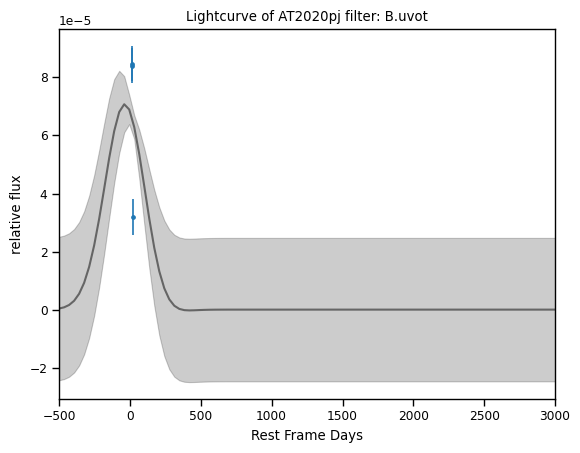

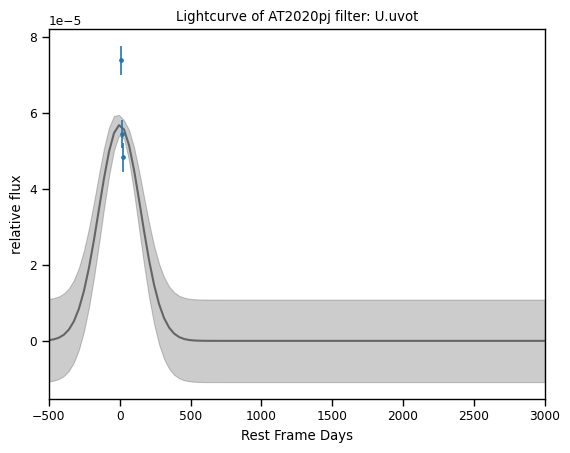

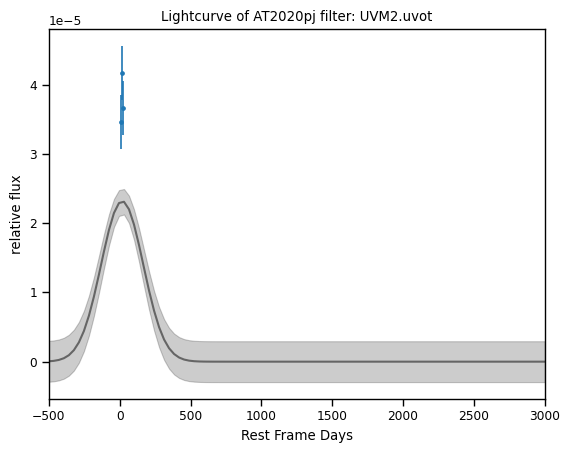

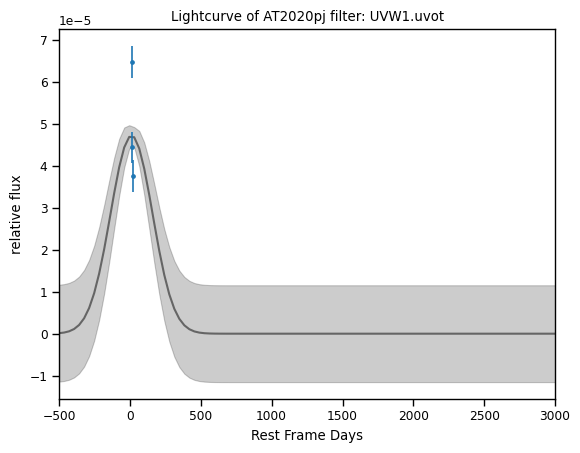

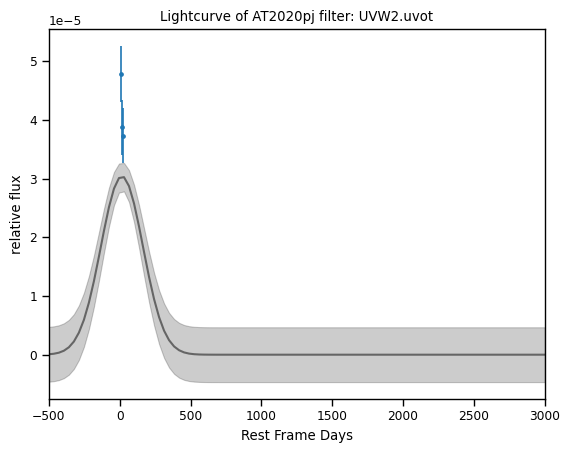

...

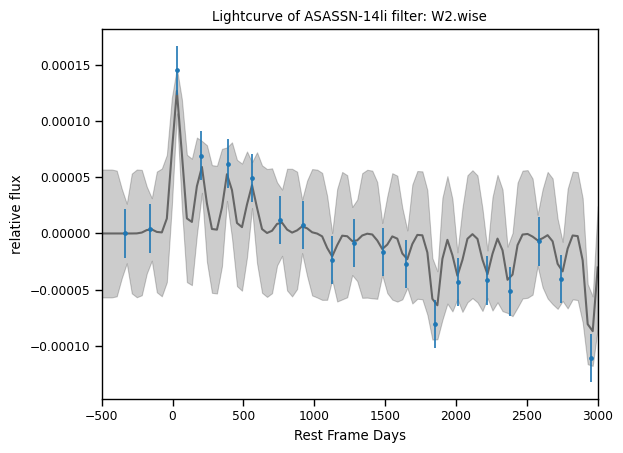

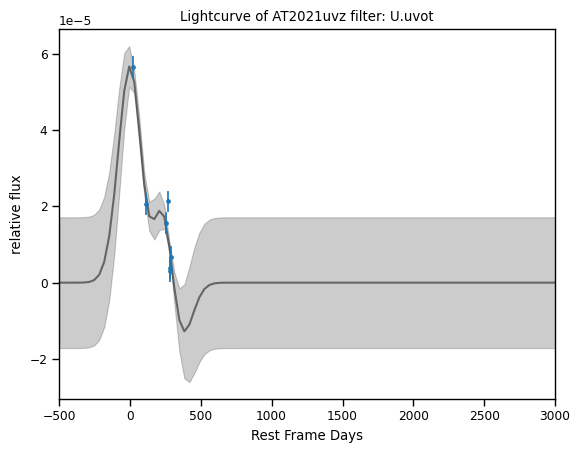

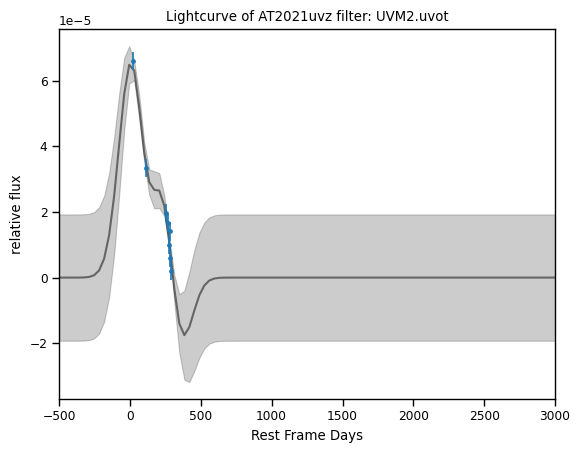

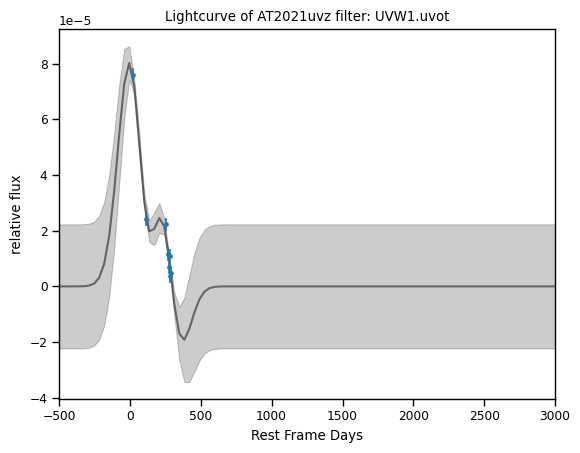

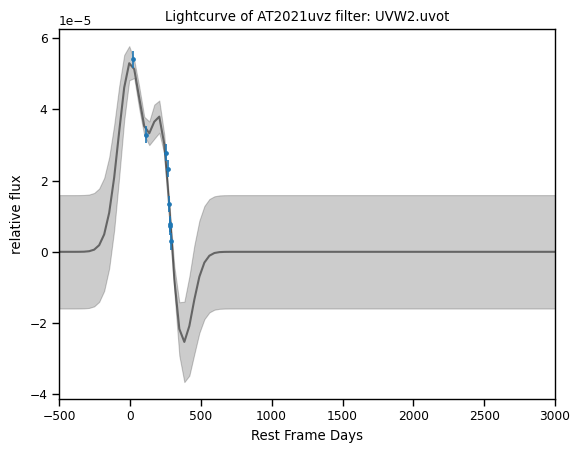

/Users/snorris/.conda/envs/TDE/lib/python3.12/site-packages/george/kernels.py:94: RuntimeWarning: divide by zero encountered in log
  log_constant = np.log(float(b)/self.ndim)


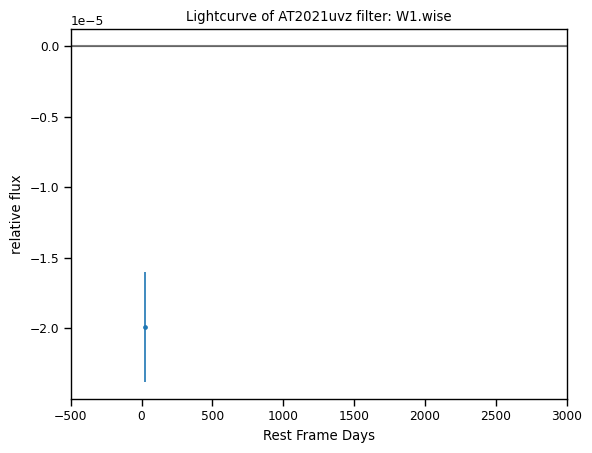

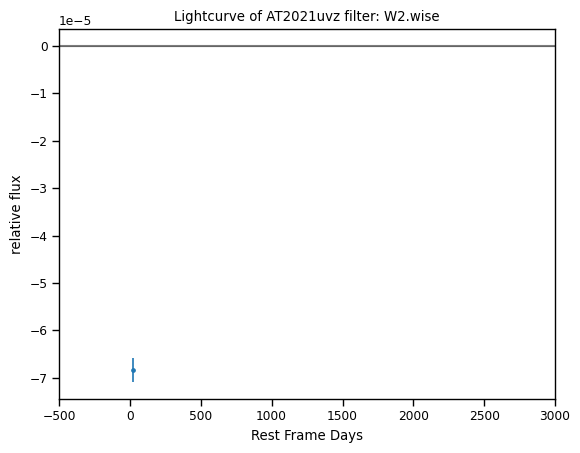

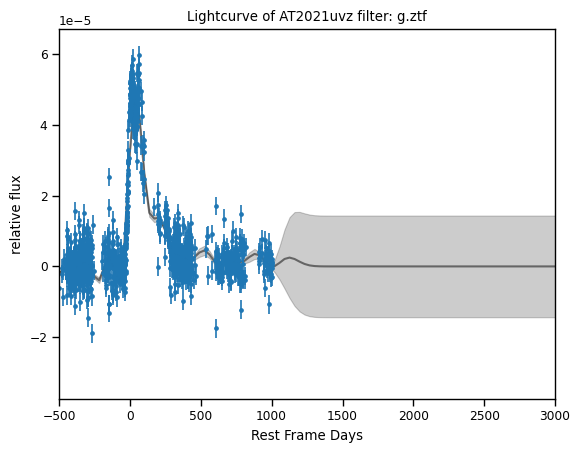

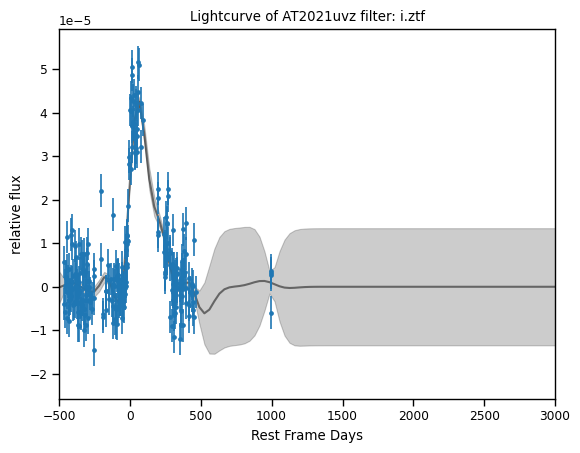

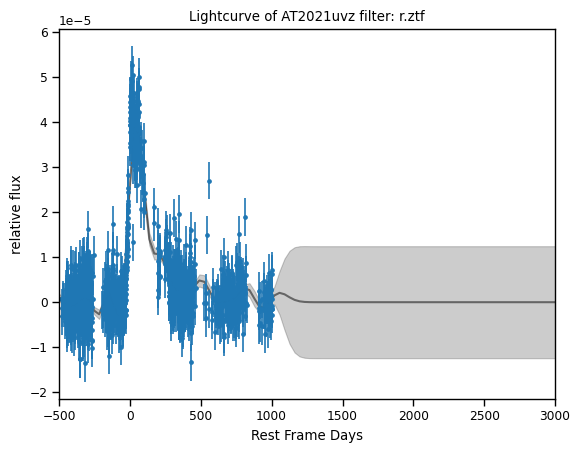

...

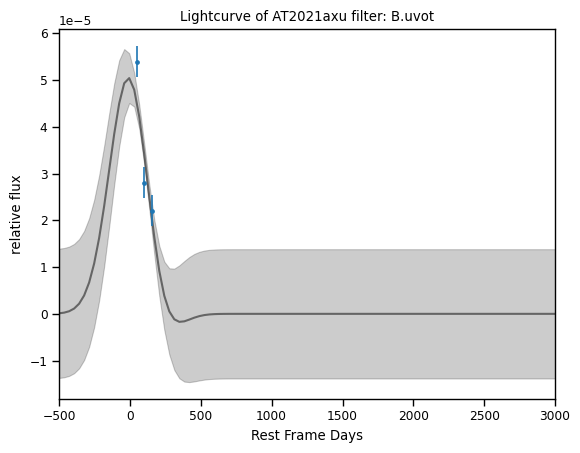

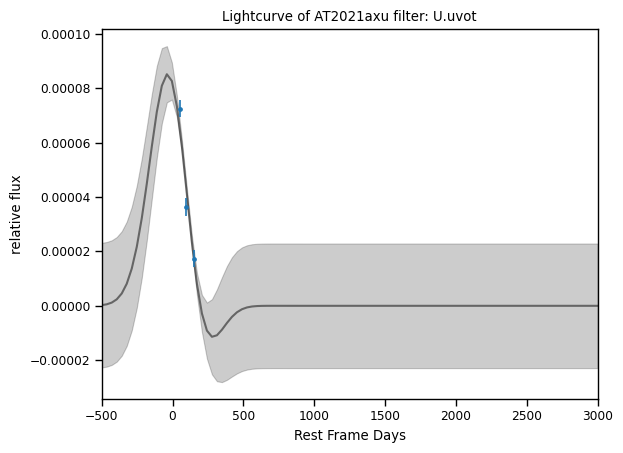

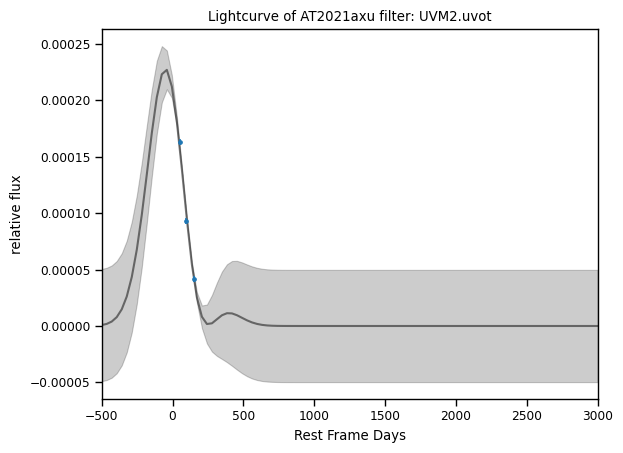

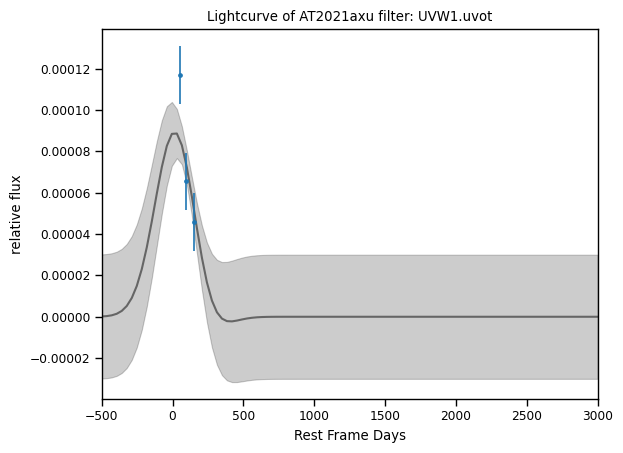

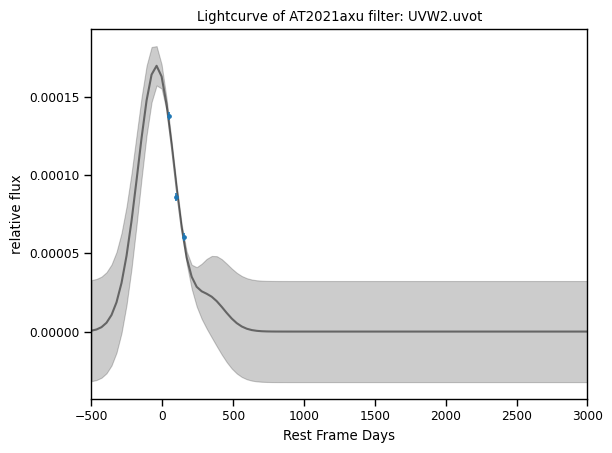

ValueError: array must not contain infs or NaNs

In [14]:
def flux_gp(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    lc_filters = tde_data['lightcurve']['filters']
    for i in range(len(lc_filters)):
        kernel = np.var(y_flux(tde_name)[i]) * kernels.ExpSquaredKernel(np.exp(len(y_flux(tde_name))),ndim=1)
        gp = ge.GP(kernel)
        gp.compute(x_rest_time(tde_name)[i], y_flux_error(tde_name)[i])
        x_pred = np.linspace(-500,3000 , 100)
        pred, pred_var = gp.predict(y_flux(tde_name)[i], x_pred, return_var=True)
        plt.fill_between(x_pred, pred - np.sqrt(pred_var), pred + np.sqrt(pred_var),
                    color="k", alpha=0.2)
        plt.plot(x_pred, pred, "k", lw=1.5, alpha=0.5)
        plt.errorbar(x_rest_time(tde_name)[i],y_flux(tde_name)[i],yerr = y_flux_error(tde_name)[i],fmt='.')
        plt.xlim(-500,3000)
        plt.title("Lightcurve of {}".format(tde_name) + ' filter: ' + str(lc_filters[i]))
        plt.ylabel('relative flux')
        plt.xlabel('Rest Frame Days')
        plt.show()
for json_file in json_list[:]:
    tde_name = json_file[:-5]
    flux_gp(tde_name) 

In [16]:
def get_measure(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    wave, flux = get_sed(tde_name)
    chi_list = []
    if len(flux) == 0:
    	return None
    popt, pcov = curve_fit(blackbody_flux,
                           wave, flux, p0 = [2e4, 1e19],
                           bounds = ([1, -np.inf], [1e6, np.inf]))
    temperature = popt[0]
    degrees_of_freedom = len(flux) 
    resid = (flux- blackbody_flux(wave, *popt)) / np.std(flux)
    chisq = np.dot(resid, resid)
    measure = (chisq/degrees_of_freedom)
    return measure
temperatures = {}
chi_list = []
for tde in tde_names:
    wave, flux = get_sed(tde_name)
    t = get_temperature(tde)
    temperatures[tde] = t
    if get_measure(tde) != float('inf'):
        if t:
            chi_list.append(get_measure(tde))
print(chi_list)

/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/384667270.py:12: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,
/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/3286610914.py:8: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,
/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/3286610914.py:13: RuntimeWarning: divide by zero encountered in divide
  resid = (flux- blackbody_flux(wave, *popt)) / np.std(flux)


[87.10247340894892, 0.04097826892865457, 0.4579759819929763, 0.03037666031760112, 4.773363791536257e-14, 0.03639085122166099, 0.27438300902158236, 2.156827077231241e-05, 10.061763934029317, 0.027980177144897065, 0.1516466408730519, 0.5931219154040192, 0.3093343741217576, 0.8171734399184666, 0.025810729698549275, 0.035135783263378094, 0.04805253974007125, 12.990474814874261, 0.054396302660959024, 0.5928757607768088, 0.04047544673825659, 0.10977724249507721, 2.4807709009354455, 9.12697795118946, 0.168289708853597, 0.1400402099424578, 0.7663457199629042, 0.03761884469685974, 0.5278755638205208, 0.19155428180944933, 0.04490680053713994, 25.76056547586705, 0.6643914987295756, 0.8103706165914794, 0.2924794221271997, 0.017722978070288442, 0.08233581449131817, 0.09737204469075388, 0.005973143608834117, 0.23295338225438733, 0.2562742779745247, 0.13229185464636548, 0.047424548912773604, 71.69119978087664, 51.623852877753166, 5.0251341362345086, 0.1405028043281889, 0.47187929228452985, 0.12234134

In [17]:
chi_frame = pd.DataFrame(np.array(chi_list))

Text(0.5, 0, 'chi-squared')

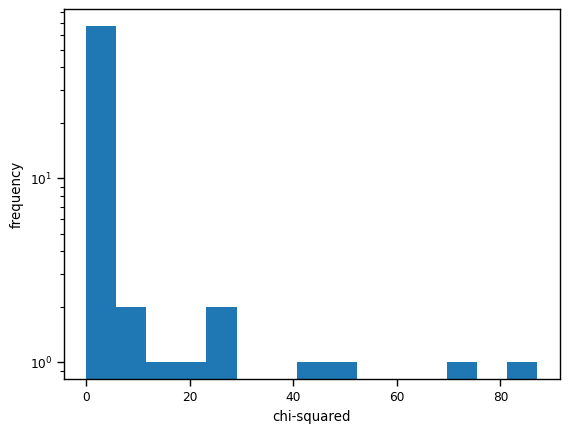

In [18]:
plt.hist(np.array(chi_list),bins=15,log =True)
plt.ylabel('frequency')
plt.xlabel('chi-squared')


Text(0.5, 0, 'chi-squared')

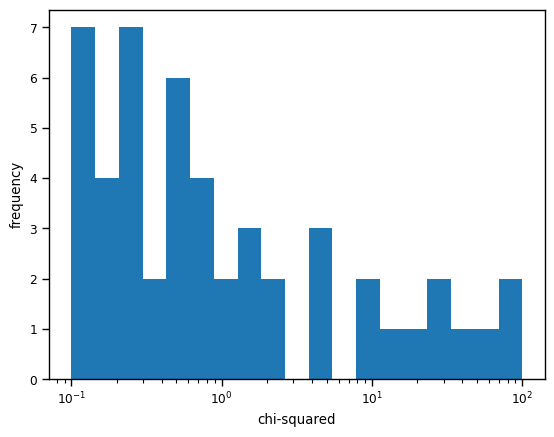

In [19]:
plt.hist(chi_list,bins=np.logspace(np.log10(0.1),np.log10(100.0), 20))
plt.xscale('log')
plt.ylabel('frequency')
plt.xlabel('chi-squared')

In [20]:
temperatures = {}
valid_tde = []
invalid_tde = []
for tde in tde_names:
    t = get_temperature(tde)
    temperatures[tde] = t
    if t:
        if get_measure(tde) <= 1.67:
            valid_tde.append(tde)
        else:
            invalid_tde.append(tde)
    else:
        invalid_tde.append(tde)


/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/384667270.py:12: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,
/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/3286610914.py:8: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,
/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/3286610914.py:13: RuntimeWarning: divide by zero encountered in divide
  resid = (flux- blackbody_flux(wave, *popt)) / np.std(flux)


In [21]:
invalid_tde

['AT2020pj',
 'AT2020abri',
 'AT2018bsi',
 'AT2020vwl',
 'AT2019mha',
 'PTF-09axc',
 'AT2021lo',
 'AT2022exr',
 'AT2018fyk',
 'AT2020vdq',
 'GALEX-D1-9',
 'AT2022gri',
 'AT2021crk',
 'GALEX-D3-13',
 'AT2018iih',
 'AT2018hco',
 'AT2020ksf',
 'AT2019teq',
 'AT2019lwu',
 'SDSS-TDE2',
 'GALEX-D23H-1',
 'PTF-09djl',
 'AT2020ysg',
 'AT2022dyt',
 'PS1-11af',
 'AT2017eqx',
 'AT2019cho',
 'ASASSN-15oi',
 'AT2020mbq',
 'AT2021mhg']

In [22]:
valid_tde

['ASASSN-14li',
 'AT2021uvz',
 'AT2019azh',
 'PTF-09ge',
 'AT2020acka',
 'AT2021axu',
 'PS1-10jh',
 'AT2020wey',
 'AT2020yue',
 'AT2020neh',
 'AT2022pna',
 'AT2021jsg',
 'AT2023mfm',
 'AT2021nwa',
 'AT2018lni',
 'AT2021sdu',
 'OGLE16aaa',
 'AT2021ehb',
 'AT2021yte',
 'AT2022bdw',
 'AT2020ddv',
 'AT2022wtn',
 'SDSS-TDE1',
 'AT2023cvb',
 'AT2021ack',
 'AT2021jjm',
 'AT2021uqv',
 'AT2019ahk',
 'AT2021utq',
 'AT2021gje',
 'AT2022rz',
 'AT2019ehz',
 'iPTF-15af',
 'AT2020qhs',
 'AT2019dsg',
 'AT2023rvb',
 'AT2019cmw',
 'ASASSN-15lh',
 'AT2019eve',
 'iPTF-16fnl',
 'ASASSN-14ae',
 'AT2022lri',
 'AT2018lna',
 'AT2018zr',
 'AT2020ocn',
 'AT2019meg',
 'AT2020opy',
 'AT2023clx',
 'AT2019qiz',
 'AT2020riz',
 'AT2018jbv',
 'AT2018dyb',
 'AT2020zso',
 'AT2019vcb',
 'AT2020mot',
 'AT2019bhf',
 'AT2022dbl',
 'AT2022dsb',
 'iPTF-16axa',
 'AT2018hyz',
 'AT2021yzv',
 'AT2022hvp']

In [23]:
len(valid_tde) + len(invalid_tde)

92

In [24]:
for tde in invalid_tde:
    print(get_measure(tde))

/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/3286610914.py:8: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,
/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/3286610914.py:13: RuntimeWarning: divide by zero encountered in divide
  resid = (flux- blackbody_flux(wave, *popt)) / np.std(flux)


87.10247340894892
10.061763934029317
inf
None
12.990474814874261
inf
2.4807709009354455
9.12697795118946
None
inf
25.76056547586705
None
inf
inf
None
inf
71.69119978087664
51.623852877753166
5.0251341362345086
None
43.99707867333214
inf
inf
21.062915165376086
4.0799067220715886
None
2.122660537932849
inf
3.940277598232621
28.24030429977187


In [25]:
for tde in valid_tde:
    print(get_measure(tde))

0.04097826892865457
0.4579759819929763
0.03037666031760112
4.773363791536257e-14


/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/3286610914.py:8: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,


0.03639085122166099
0.27438300902158236
2.156827077231241e-05
0.027980177144897065
0.1516466408730519
0.5931219154040192
0.3093343741217576
0.8171734399184666
0.025810729698549275
0.035135783263378094
0.04805253974007125
0.054396302660959024
0.5928757607768088
0.04047544673825659
0.10977724249507721
0.168289708853597
0.1400402099424578
0.7663457199629042
0.03761884469685974
0.5278755638205208
0.19155428180944933
0.04490680053713994
0.6643914987295756
0.8103706165914794
0.2924794221271997
0.017722978070288442
0.08233581449131817
0.09737204469075388
0.005973143608834117
0.23295338225438733
0.2562742779745247
0.13229185464636548
0.047424548912773604
0.1405028043281889
0.47187929228452985
0.12234134292178594
0.2955543034045976
0.994578956959677
0.0266206836571881
0.053950161751256366
0.4508779500003145
1.3902418127549943
1.4680508785130615
0.021197237586001595
0.9081325152182315
0.09864723257628993
0.26912646795908807
0.10047285623836344
1.4151735208166816
0.09656458879040367
0.11364011070

In [26]:
import pickle

with open('no_plateau_tdes.pkl', 'rb') as f:
    no_plateau = pickle.load(f)

In [27]:
with open('plateau_tdes.pkl', 'rb') as f:
    plateau = pickle.load(f)

In [28]:
for i in range(len(invalid_tde)):
    if invalid_tde[i] in plateau['Name']:
        print(invalid_tde[i] + ' peak temperature is ' + str(10**(plateau['Peak temperature'][np.where(np.array(plateau['Name']) == invalid_tde[i])[0][0]][0])) + ' K')
    else:
        if invalid_tde[i] in no_plateau['Name']:
            print(invalid_tde[i] + ' peak temperature is ' + str(10**(no_plateau['Peak temperature'][np.where(np.array(no_plateau['Name']) == invalid_tde[i])[0][0]][0]))+' K')
        else: print(invalid_tde[i] + ' is not in pickle files.')

AT2020pj peak temperature is 13436.263677517341 K
AT2020abri peak temperature is 13787.6990796798 K
AT2018bsi peak temperature is 23047.21923033187 K
AT2020vwl peak temperature is 19270.33553241187 K
AT2019mha peak temperature is 18270.86618460923 K
PTF-09axc peak temperature is 30026.63164823927 K
AT2021lo is not in pickle files.
AT2022exr is not in pickle files.
AT2018fyk peak temperature is 35194.82743565415 K
AT2020vdq is not in pickle files.
GALEX-D1-9 is not in pickle files.
AT2022gri is not in pickle files.
AT2021crk peak temperature is 19964.819095596584 K
GALEX-D3-13 is not in pickle files.
AT2018iih peak temperature is 17786.79436170053 K
AT2018hco peak temperature is 20826.789947565423 K
AT2020ksf is not in pickle files.
AT2019teq peak temperature is 14989.620267960046 K
AT2019lwu peak temperature is 13901.054304888878 K
SDSS-TDE2 peak temperature is 22885.829697241814 K
GALEX-D23H-1 peak temperature is 47264.91346839891 K
PTF-09djl peak temperature is 22792.990323394482 K
A

In [29]:
plateau['Name'][1]

'SDSS-TDE2'

In [30]:
plateau['Peak temperature'][1]

array([4.35956666, 0.03403115, 0.03653454])

In [31]:
10**4.35956666

22885.829599538367

/var/folders/sf/0bstxplx5xl9vkm7jtbmvr8h0005v1/T/ipykernel_87254/384667270.py:12: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(blackbody_flux,


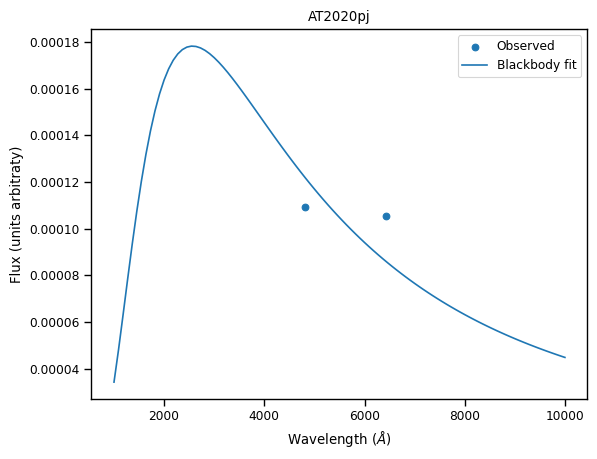

Fit to AT2020pj is 19876.073944266016 degrees K.


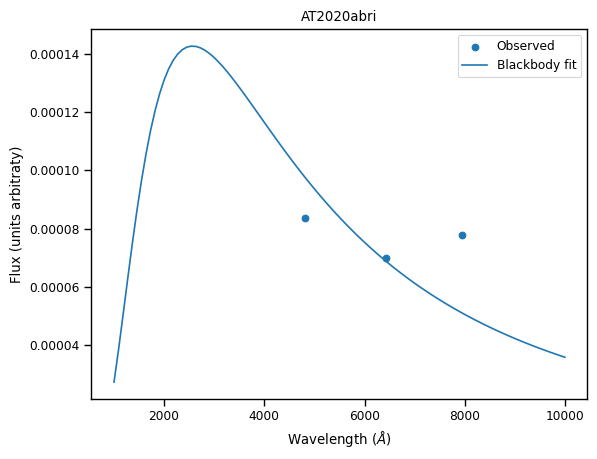

Fit to AT2020abri is 19868.767077250686 degrees K.


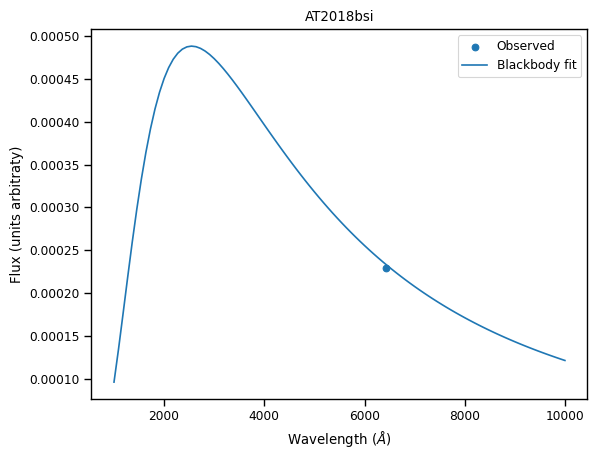

Fit to AT2018bsi is 20001.16826288885 degrees K.
No observations near peak for TDE AT2020vwl


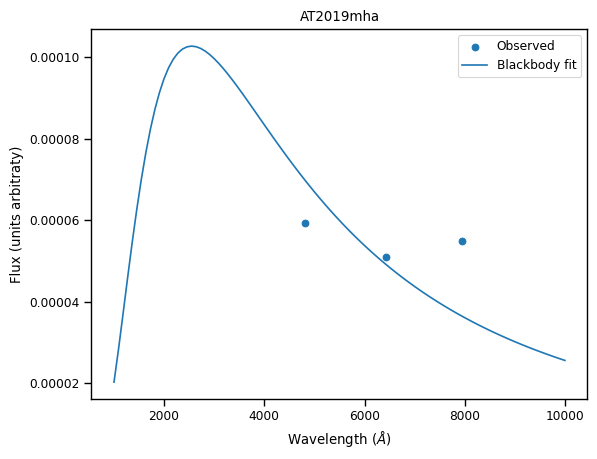

Fit to AT2019mha is 19999.99997991547 degrees K.


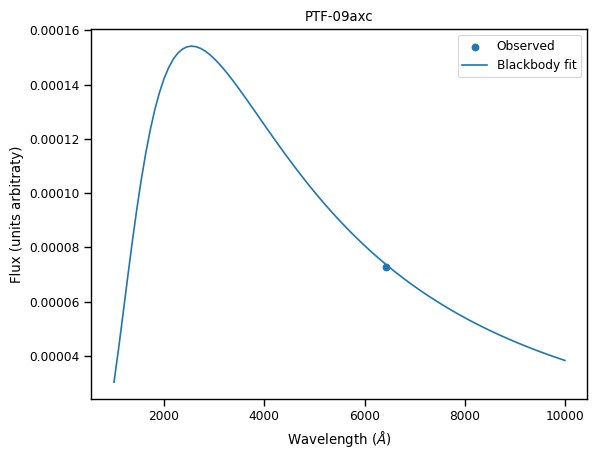

Fit to PTF-09axc is 20000.187083759996 degrees K.


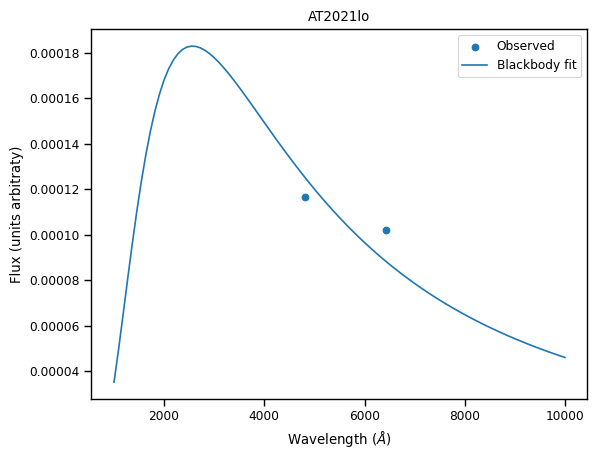

Fit to AT2021lo is 19877.425277656555 degrees K.


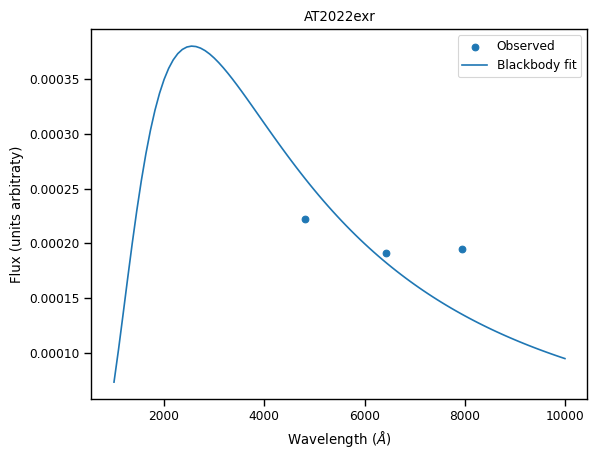

Fit to AT2022exr is 19923.37844326871 degrees K.
No observations near peak for TDE AT2018fyk


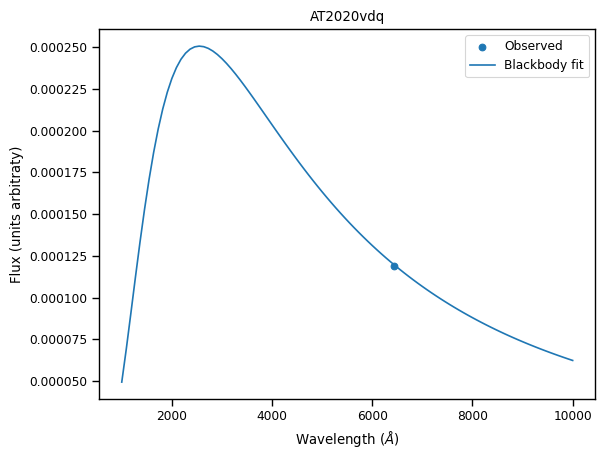

Fit to AT2020vdq is 20000.28646046615 degrees K.


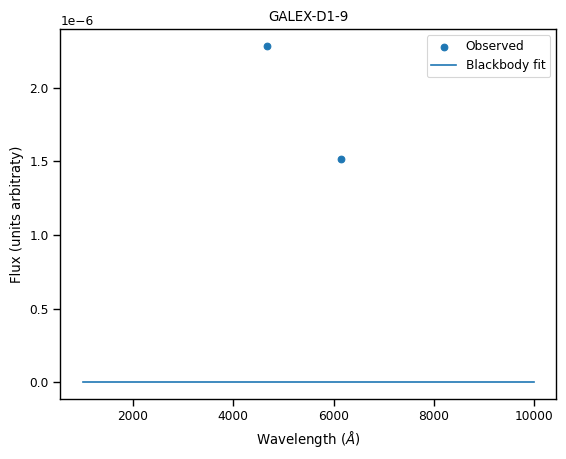

Fit to GALEX-D1-9 is 20000.00001858813 degrees K.
No observations near peak for TDE AT2022gri


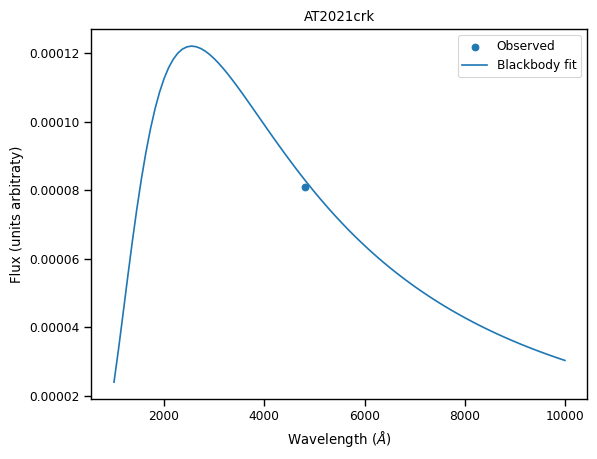

Fit to AT2021crk is 20000.08470502862 degrees K.


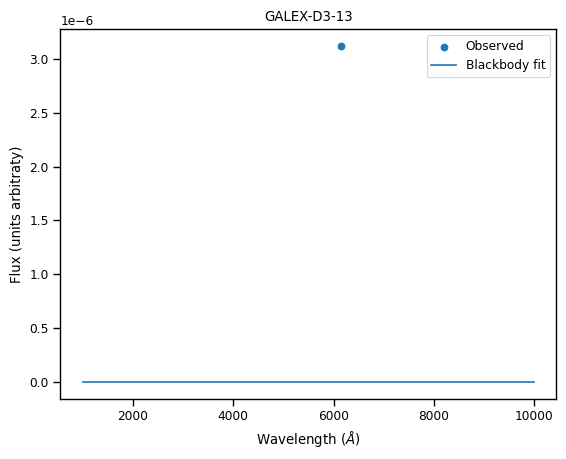

Fit to GALEX-D3-13 is 20000.000006435715 degrees K.
No observations near peak for TDE AT2018iih


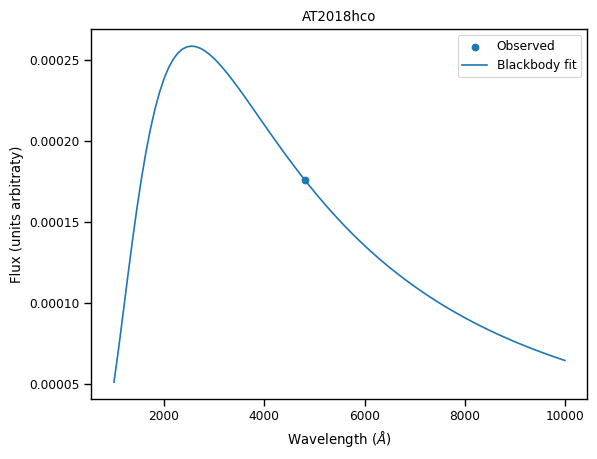

Fit to AT2018hco is 20000.800836372266 degrees K.


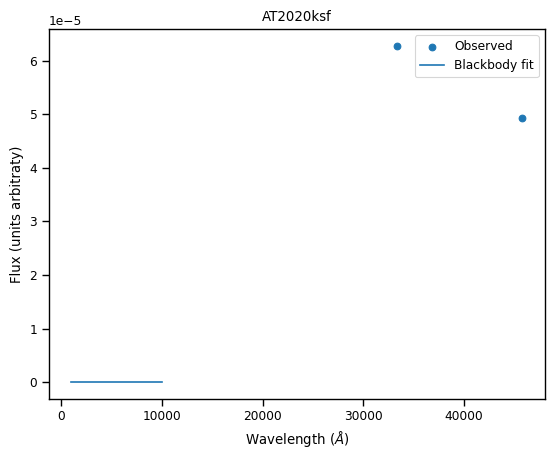

Fit to AT2020ksf is 19999.999982670524 degrees K.


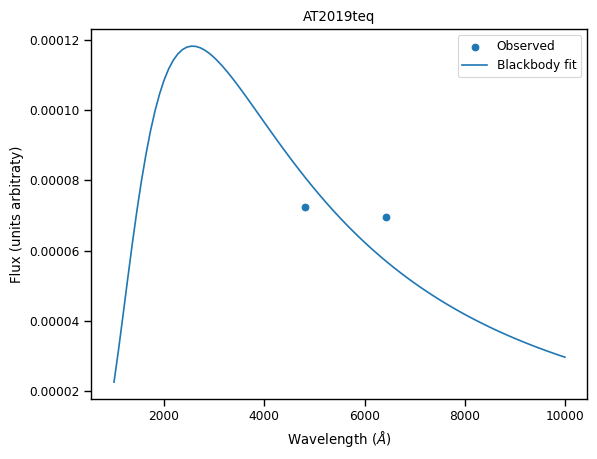

Fit to AT2019teq is 19866.343511810966 degrees K.


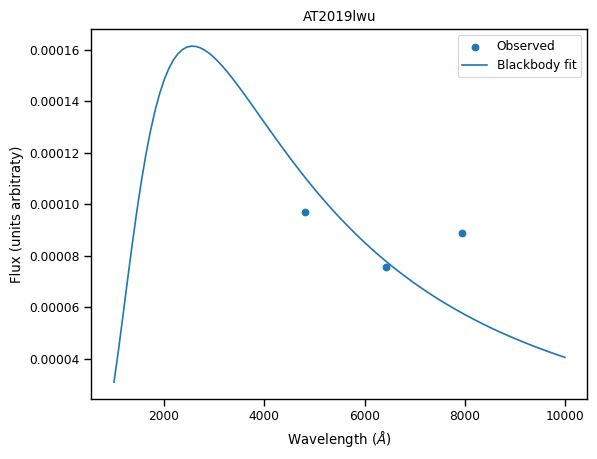

Fit to AT2019lwu is 19872.032511089288 degrees K.
No observations near peak for TDE SDSS-TDE2


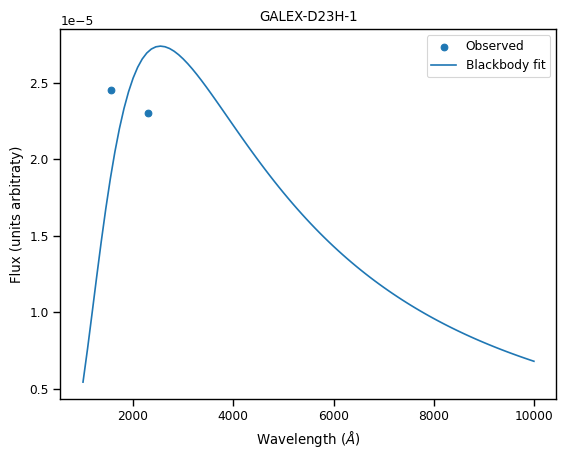

Fit to GALEX-D23H-1 is 20033.524960747753 degrees K.


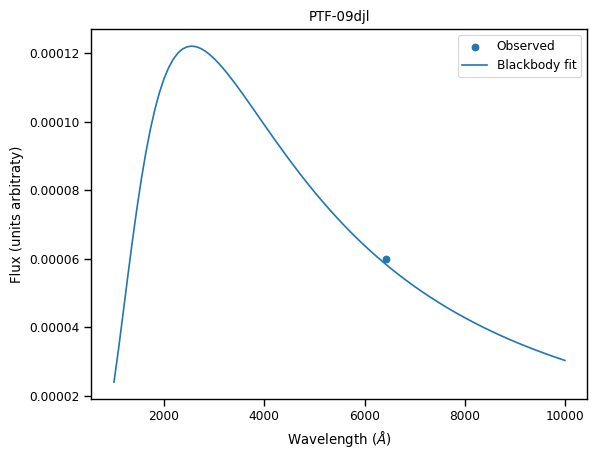

Fit to PTF-09djl is 20000.07302752886 degrees K.


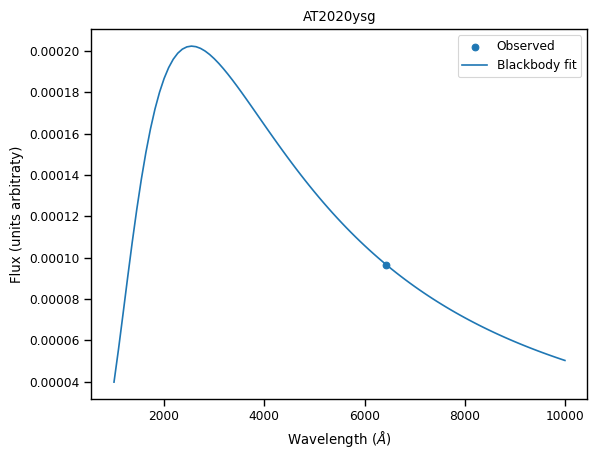

Fit to AT2020ysg is 20000.475164905678 degrees K.


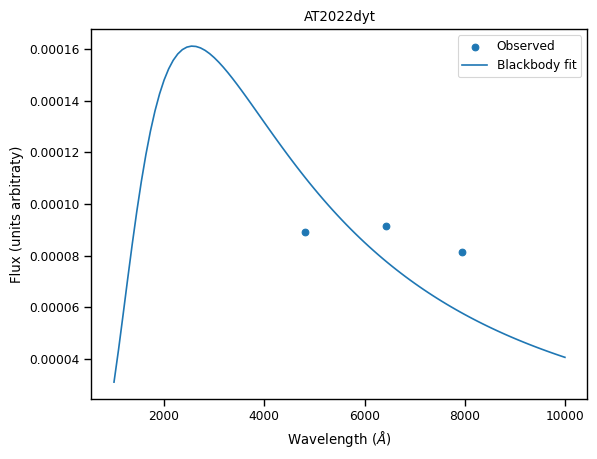

Fit to AT2022dyt is 19872.002388027748 degrees K.


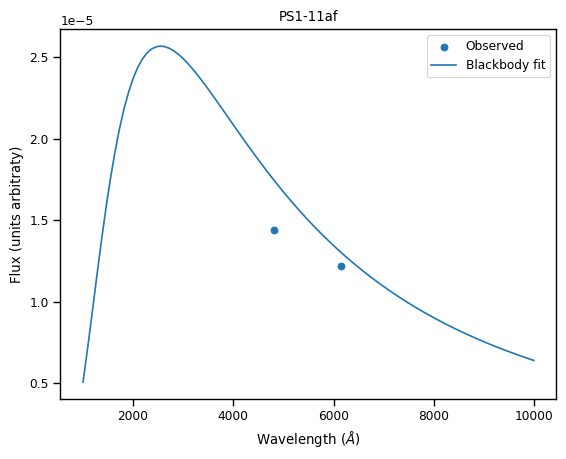

Fit to PS1-11af is 19999.999995708888 degrees K.
No observations near peak for TDE AT2017eqx


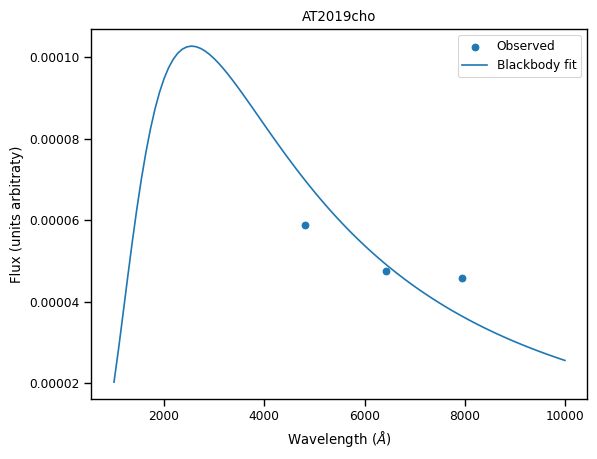

Fit to AT2019cho is 19999.99997991547 degrees K.


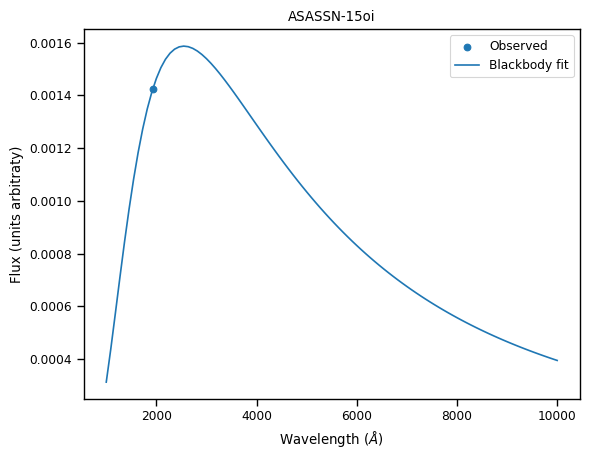

Fit to ASASSN-15oi is 19999.842638239665 degrees K.


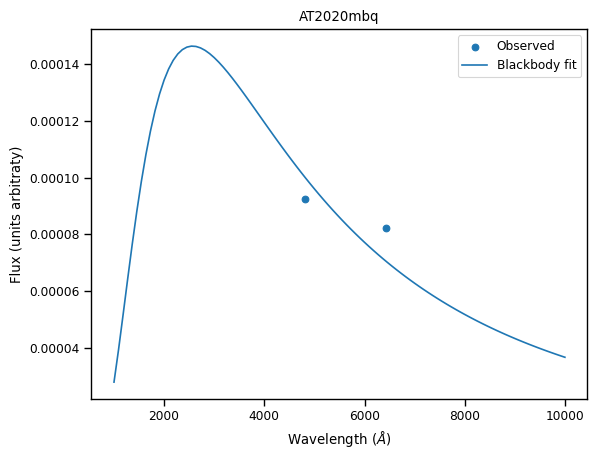

Fit to AT2020mbq is 19869.297224601083 degrees K.


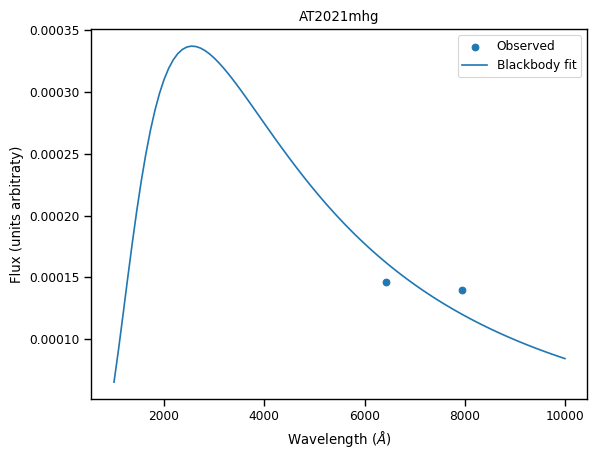

Fit to AT2021mhg is 19923.616537411282 degrees K.


In [33]:
for tde in invalid_tde:
    t = get_temperature(tde,plotting=True)
    temperatures[tde] = t
    if t:
    	print(f'Fit to {tde} is {t} degrees K.')
    else:
    	print(f'No observations near peak for TDE {tde}')

In [56]:
import seaborn as sns
from astropy.modeling.physical_models import BlackBody
from scipy.optimize import curve_fit
from scipy.optimize import minimize
sns.set_context('paper')

# We want to predict the phase near the date of the TDE, between -100 and 100 days from peak
phase_pred = np.linspace(-100, 100, 150)

# Define the kernel of the GP.  We set some initial parameters for its width and amplitude
kernel = np.var(y_flux('AT2021uqv')[7]) * ge.kernels.ExpSquaredKernel(100, ndim=1)
# Initialize the GP. We specify fit_kernel=True so in the parameter optimization it optimizes the kernel as well
gp = ge.GP(kernel, fit_kernel=True, fit_mean=True)
print('GP params:', gp.get_parameter_vector())

# Compute the initial GP parameters
gp.compute(x_rest_time('AT2021uqv')[7], y_flux_error('AT2021uqv')[7])

# Define the functions to optimize the GP
def neg_ln_like(p):
    gp.set_parameter_vector(p)
    return -gp.log_likelihood(y_flux('AT2021uqv')[7])

def grad_neg_ln_like(p):
    gp.set_parameter_vector(p)
    return -gp.grad_log_likelihood(y_flux('AT2021uqv')[7])

# Optimize
result = minimize(neg_ln_like, gp.get_parameter_vector(), jac=grad_neg_ln_like)
gp.set_parameter_vector(result.x)
print('New GP params:', gp.get_parameter_vector())

# Predict flux with the GP
pred, pred_var = gp.predict(y_flux('AT2021uqv')[7], phase_pred, return_var=True)

GP params: [-21.68828313   4.60517019]
New GP params: [-22.15872666   6.01318159]


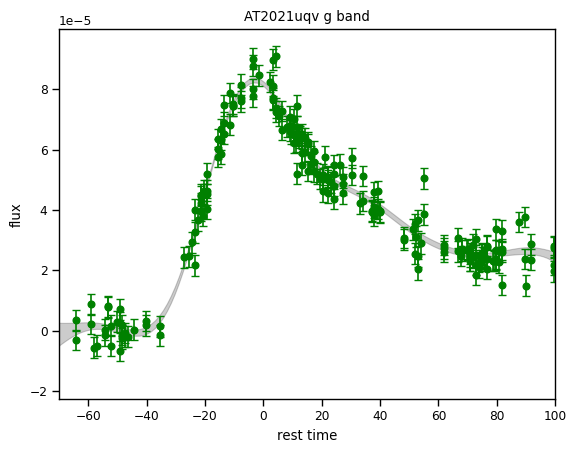

In [58]:
# Let's plot this

plt.errorbar(x_rest_time('AT2021uqv')[7], y_flux('AT2021uqv')[7], yerr=y_flux_error('AT2021uqv')[7], capsize=3, ls='none', marker = 'o', c = 'green')
plt.fill_between(phase_pred, pred - np.sqrt(pred_var), pred + np.sqrt(pred_var),
                color="k", alpha=0.2, zorder=1)
plt.xlabel('rest time')
plt.ylabel('flux')
plt.title('AT2021uqv' + ' ' + 'g band')
plt.xlim(-70, 100)
plt.show()

In [55]:
def filters(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    lc_filters = tde_data['lightcurve']['filters']
    return lc_filters
filters(plateau['Name'][-6])


['B.uvot',
 'U.uvot',
 'UVM2.uvot',
 'UVW1.uvot',
 'UVW2.uvot',
 'W1.wise',
 'W2.wise',
 'g.ztf',
 'i.ztf',
 'r.ztf']

In [ ]:
def flux_gp(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    lc_filters = tde_data['lightcurve']['filters']
    for i in range(len(lc_filters)):
        kernel = np.var(y_flux(tde_name)[i]) * kernels.ExpSquaredKernel(np.exp(len(y_flux(tde_name))),ndim=1)
        gp = ge.GP(kernel)
        gp.compute(x_rest_time(tde_name)[i], y_flux_error(tde_name)[i])
        x_pred = np.linspace(-500,3000 , 100)
        pred, pred_var = gp.predict(y_flux(tde_name)[i], x_pred, return_var=True)
        plt.fill_between(x_pred, pred - np.sqrt(pred_var), pred + np.sqrt(pred_var),
                    color="k", alpha=0.2)
        plt.plot(x_pred, pred, "k", lw=1.5, alpha=0.5)
        plt.errorbar(x_rest_time(tde_name)[i],y_flux(tde_name)[i],yerr = y_flux_error(tde_name)[i],fmt='.')
        plt.xlim(-500,3000)
        plt.title("Lightcurve of {}".format(tde_name) + ' filter: ' + str(lc_filters[i]))
        plt.ylabel('relative flux')
        plt.xlabel('Rest Frame Days')
        plt.show()
for json_file in json_list[:]:
    tde_name = json_file[:-5]
    flux_gp(tde_name) 

In [60]:
def plot_gp_flux(tde_name):
    with open("/Users/snorris/manyTDE/data/sources/{}.json".format(tde_name)) as f:
        tde_data = json.load(f)
    lc_filters = tde_data['lightcurve']['filters']
    for i in range(len(lc_filters)):
        # We want to predict the phase near the date of the TDE, between -100 and 100 days from peak
        phase_pred = np.linspace(-100, 100, 150)
        
        # Define the kernel of the GP.  We set some initial parameters for its width and amplitude
        kernel = np.var(y_flux(tde_name)[i]) * ge.kernels.ExpSquaredKernel(100, ndim=1)
        # Initialize the GP. We specify fit_kernel=True so in the parameter optimization it optimizes the kernel as well
        gp = ge.GP(kernel, fit_kernel=True, fit_mean=True)
        #print('GP params:', gp.get_parameter_vector())
        
        # Compute the initial GP parameters
        gp.compute(x_rest_time(tde_name)[i], y_flux_error(tde_name)[i])
        
        # Define the functions to optimize the GP
        def neg_ln_like(p):
            gp.set_parameter_vector(p)
            return -gp.log_likelihood(y_flux(tde_name)[i])
        
        def grad_neg_ln_like(p):
            gp.set_parameter_vector(p)
            return -gp.grad_log_likelihood(y_flux(tde_name)[i])
        
        # Optimize
        result = minimize(neg_ln_like, gp.get_parameter_vector(), jac=grad_neg_ln_like)
        gp.set_parameter_vector(result.x)
        #print('New GP params:', gp.get_parameter_vector())
    
        # Predict flux with the GP
        pred, pred_var = gp.predict(y_flux(tde_name)[i], phase_pred, return_var=True)
        plt.errorbar(x_rest_time(tde_name)[i], y_flux(tde_name)[i], yerr=y_flux_error(tde_name)[i], capsize=3, ls='none', marker = 'o', c = 'green')
        plt.fill_between(phase_pred, pred - np.sqrt(pred_var), pred + np.sqrt(pred_var),
                        color="k", alpha=0.2, zorder=1)
        plt.xlabel('rest time')
        plt.ylabel('flux')
        plt.title("Lightcurve of {}".format(tde_name) + ' filter: ' + str(lc_filters[i]))
        plt.xlim(-70, 100)
        plt.show()
    

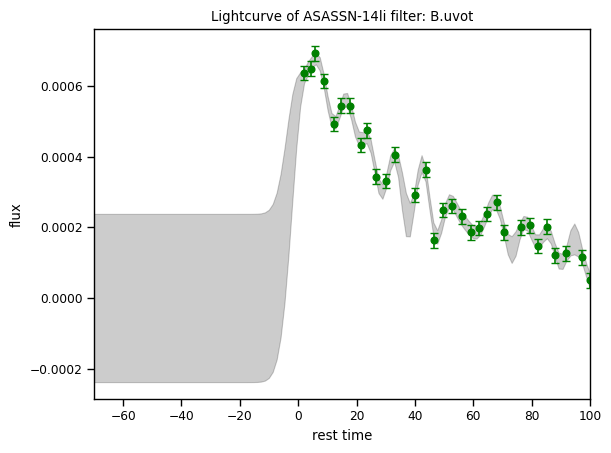

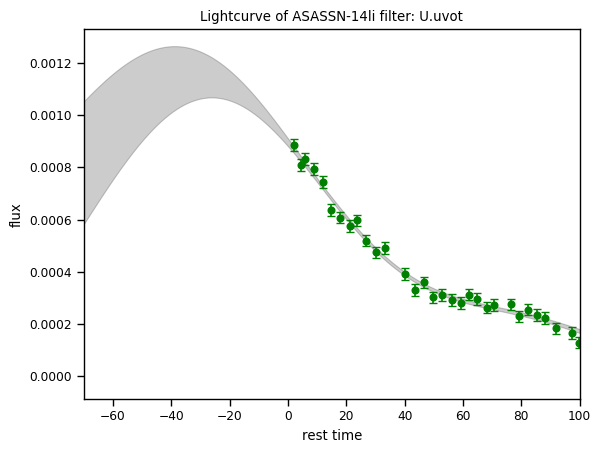

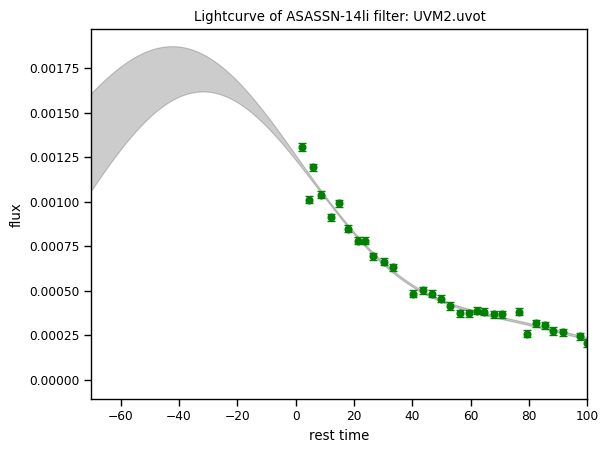

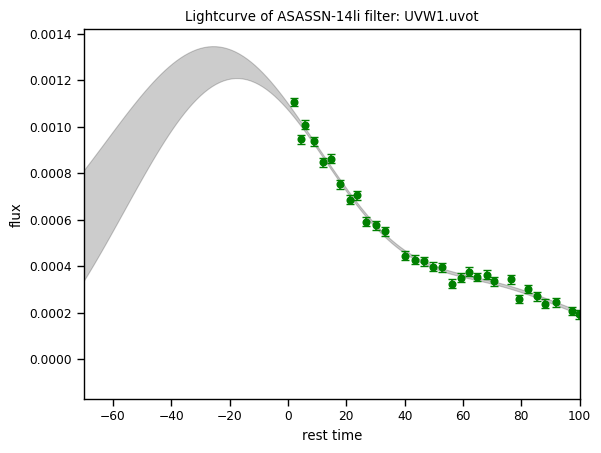

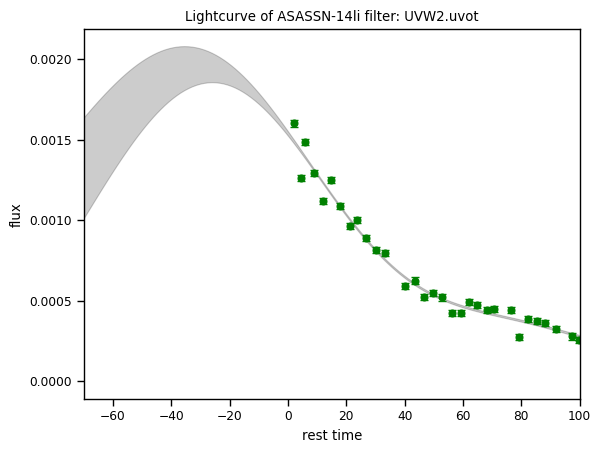

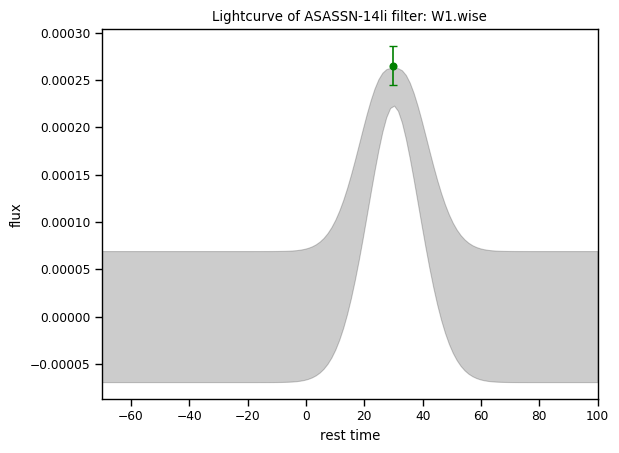

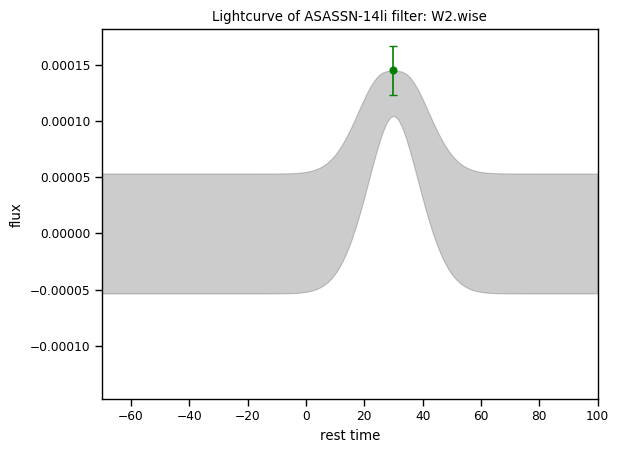

In [61]:
plot_gp_flux('ASASSN-14li')